In [7]:
%autosave 60

Autosaving every 60 seconds


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy
import math
import seaborn as sns

In [9]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_squared_error

#### Graphics settings

In [10]:
plt.style.use('seaborn-v0_8-whitegrid')
%config InlineBackend.figure_format = 'retina'

box="#20BDB8"
dimred="#D31111"
textcolor="#333333"

In [11]:
plt.rcParams.update({
    "figure.figsize": (8, 4),
    "figure.dpi": 100,

    "font.family": "monospace",
    "font.monospace": ["Courier New", "Consolas"],

    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
    "axes.titlecolor": "#555555",
    "axes.titlepad": 15,
    "axes.labelsize": 12,
    "axes.labelpad": 10,

    "xtick.labelsize": 10,
    "ytick.labelsize": 10,

    "axes.prop_cycle": plt.cycler(color=["#20BDB8"]),

    "figure.facecolor": "none",
    "axes.facecolor": "white",

    "axes.edgecolor": "#7B7B7B",
    "axes.linewidth": 1,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.spines.left": True,
    "axes.spines.bottom": True,

    "axes.grid": True,
    "grid.color": "#c8c8c8",
    "grid.linestyle": "-",
    "grid.linewidth": 0.7,
    "grid.alpha": 0.3,

    "xtick.color": "#333333",
    "ytick.color": "#333333",
    "xtick.major.pad": 5,
    "ytick.major.pad": 5,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 2,
    "ytick.major.size": 2,
    "xtick.minor.size": 0,
    "ytick.minor.size": 0,
    "xtick.direction": "out",
    "ytick.direction": "out",

    "patch.edgecolor": "white",
    "patch.linewidth": 0.8,
    "patch.facecolor": "#20BDB8",
})

# Data EDA

### Data load

In [12]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

df_train_original = df_train.copy()
df_test_original = df_test.copy()

In [13]:
df_train.head(5)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host,target
0,Belle Harbor 4 BR 2 bath- 1 bl from Beach,40327248,Sarina,Queens,Neponsit,40.57215,-73.85822,Entire home/apt,350,2,5,2019-07-07,2.88,1,334
1,"Come see Brooklyn, New York",13617520,Howard T.,Brooklyn,Clinton Hill,40.69172,-73.96934,Shared room,40,5,8,2015-02-25,0.13,1,0
2,Large 2Br on W71st & Columbus Feb 19-28,26754726,Julie,Manhattan,Upper West Side,40.77673,-73.98011,Entire home/apt,200,5,0,NaN,NaN,1,0
3,Perfect bedroom. Near Subways Columbia CityCol...,16721721,Federico,Manhattan,Harlem,40.81530,-73.95080,Private room,65,2,18,2018-11-04,0.64,1,0
4,Cozy Sun Filled Fresh Guest Room in Artsy Bush...,22246463,Lisa,Brooklyn,Bushwick,40.70230,-73.92935,Private room,99,2,26,2019-06-23,0.76,1,155


In [14]:
df_test.head(2)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host
0,Amazing 4 Bedrooms 4 Bathrooms sleeps 9,199147185,Lou,Brooklyn,Sunset Park,40.66468,-73.99785,Entire home/apt,399,1,0,NaN,NaN,5
1,Super Spacious room in Brooklyn,259427246,Nelly,Brooklyn,Bedford-Stuyvesant,40.67880,-73.92722,Private room,43,1,4,2019-06-10,2.0,3


In [15]:
df_train.describe()

,_id,lat,lon,sum,min_days,amt_reviews,avg_reviews,total_host,target
count,3.667100e+04,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,29169.000000,36671.000000,36671.000000
mean,6.720433e+07,40.729080,-73.951958,152.142292,7.053176,23.433667,1.365601,7.047694,112.766628
std,7.828147e+07,0.054671,0.046201,239.107973,21.539569,44.703590,1.643966,32.595427,131.583284
min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,7.780024e+06,40.690090,-73.982970,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,3.053256e+07,40.723150,-73.955560,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,1.074344e+08,40.763260,-73.935865,175.000000,5.000000,24.000000,2.010000,2.000000,227.000000
max,2.743213e+08,40.912340,-73.712990,10000.000000,1250.000000,629.000000,20.940000,327.000000,365.000000


### EDA
Проверка данных и сбор статистик. 

##### Сравнение распределений признаков в train и test выборках

In [16]:
# таблица для попарного сравнения характеристик train и test
percentiles = [0.01, 0.5, 0.95, 0.99]

train_desc = df_train.describe(percentiles=percentiles)
test_desc = df_test.describe(percentiles=percentiles)

rows = []

for stat in train_desc.index:
    # train строка
    row_train = train_desc.loc[stat].copy()
    row_train.name = f"train_{stat}"
    rows.append(row_train)
    
    # test строка
    row_test = test_desc.loc[stat].copy()
    row_test.name = f"test_{stat}"
    rows.append(row_test)

display(pd.DataFrame(rows))

,_id,lat,lon,sum,min_days,amt_reviews,avg_reviews,total_host,target
train_count,3.667100e+04,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,29169.000000,36671.000000,36671.000000
test_count,1.222400e+04,12224.000000,12224.000000,12224.000000,12224.000000,12224.000000,9674.000000,12224.000000,NaN
train_mean,6.720433e+07,40.729080,-73.951958,152.142292,7.053176,23.433667,1.365601,7.047694,112.766628
test_mean,6.886703e+07,40.728555,-73.952806,154.455825,6.960324,22.796875,1.396199,7.432837,NaN
train_std,7.828147e+07,0.054671,0.046201,239.107973,21.539569,44.703590,1.643966,32.595427,131.583284
test_std,7.958145e+07,0.054105,0.046020,243.267298,17.055669,44.086754,1.785811,34.001000,NaN
train_min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
test_min,2.787000e+03,40.506410,-74.239140,0.000000,1.000000,0.000000,0.010000,1.000000,NaN
train_1%,1.041630e+05,40.596763,-74.026190,30.000000,1.000000,0.000000,0.020000,1.000000,0.000000
test_1%,8.869361e+04,40.596275,-74.027591,30.000000,1.000000,0.000000,0.020000,1.000000,NaN


Распределения числовых признаков в train и test в целом похожи по центральной части распределенения до 95-99%. Но есть необычные значения в хвостах распределений:

- `sum`: 99% = 760/800, но max=~10000. Похоже на заглушку "жилье не сдается". Можно рассмотреть сделать клиппинг по 99% от значения в train.
- `min_days`: 99% = 45 в обеих выборках, но max (train) = 1250 при max (test) = 365. Модель будет обучаться на признаках, которых нет в тестовых данных.
- `avg_reviews` (среднее количество отзывов за период ?): максимальные значения train ~21, test ~58.5, то есть в тестовых данных есть такие значения, которых нет в обучающей выборке.
- `amt_reviews`: очень длинный хвост распределения, 99% = ~211-214, при максимуме 629/607 и при медианном значении ~5 в обеих выборках.
- `total_host`: медиана ~1, при этом максимальное значение 327. В совокупности с перекосом в amt_reviews можно предположить, что это это гостиницы или бизнес-аккаунты. Можно сделать для таких хостов отдельную категорию.
- `target`: 99%=365 и max=365, это ceiling значение.

In [17]:
target = df_train['target']      # количество дней, когда жилье было занято за год

cat_cols = [
    'location_cluster',  # кластер местоположения
    'location',          # описание местоположения объекта
    'type_house'         # тип жилья
]

num_cols = [
    'sum',               # (price per night)? общая стоимость аренды или сумма за определенный период.
    'min_days',          # минимальное количество дней для бронирования объекта.
    'amt_reviews',       # количество отзывов, оставленных для данного объекта.
    'avg_reviews',       # средний рейтинг или среднее количество отзывов за определенный период.
    'total_host'         # общее количество объектов, принадлежащих одному хосту
]

date_cols = [
    'last_dt'            # дата последнего отзыва или последнего бронирования.
]

id_cols = [
    '_id',               # уникальный идентификатор
    'name',              # название объекта
    'host_name'          # имя владельца или хоста, который предоставляет жилье
]

geo_cols = [
    'lat',               # широта и долгота местоположения объекта.
    'lon'
]

##### Проверка пропусков в данных

In [18]:
# признаки с пропусками - train
df_train.isna().sum()[df_train.isna().sum() > 0].sort_values(ascending=False)

last_dt        7502
avg_reviews    7502
host_name        18
name              9
dtype: int64

In [19]:
# признаки с пропусками - test
df_test.isna().sum()[df_test.isna().sum() > 0].sort_values(ascending=False)

last_dt        2550
avg_reviews    2550
name              7
host_name         3
dtype: int64

In [20]:
# совпадают ли пропуски в avg_reviews и last_dt в train?
print("Пропуски в avg_reviews и last_dt совпадают в train:",
      (df_train['avg_reviews'].isna() == df_train['last_dt'].isna()).all())

display(pd.crosstab(
    df_train['last_dt'].isna(),
    df_train['avg_reviews'].isna()
))

# в test
print("Пропуски в avg_reviews и last_dt совпадают в test:",
      (df_test['avg_reviews'].isna() == df_test['last_dt'].isna()).all())

display(pd.crosstab(
    df_test['last_dt'].isna(),
    df_test['avg_reviews'].isna()
))

Пропуски в avg_reviews и last_dt совпадают в train: True


avg_reviews,False,True
last_dt,,
False,29169,0
True,0,7502


Пропуски в avg_reviews и last_dt совпадают в test: True


avg_reviews,False,True
last_dt,,
False,9674,0
True,0,2550


- Пропуски в 'avg_reviews' и 'last_dt' полностью совпадают, значит у ряда объектов нет отзывов и, соответственно, даты последнего отзыва. 
- временной признак 'last_dt' можно преобразовать в числовой признак 'days_since_last_review'.

---

#### Таргет

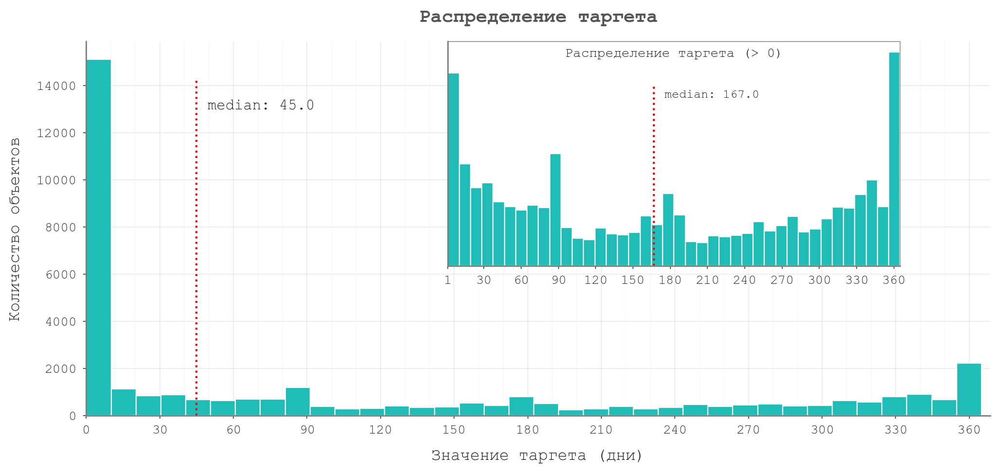

In [21]:
fig, ax = plt.subplots(figsize=(12, 5))

# гистограмма
df_train['target'].hist(bins=36, ax=ax, color=box, edgecolor='white')

# медиана
median = df_train['target'].median()
ax.axvline(median, color=dimred, linestyle=':', lw=1.5, ymax=0.9,)
ax.text(median*1.1, 13000, f'median: {median}')

# тики
ax.set_xticks(np.arange(0, 366, 30))
ax.set_xticks(np.arange(0, 366, 10), minor=True)
ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)

# настройки гистограммы
ax.set_xlim(0, df_train['target'].max()*1.01)
ax.set_title("Распределение таргета")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("Количество объектов")

# ZOOM: распределение без нулей

axins = ax.inset_axes([0.40, 0.40, 0.5, 0.6])

target_nozeros = df_train['target'][df_train['target'] > 0]

target_nozeros.hist(bins=40, ax=axins, color=box, edgecolor='white')

# zoom: медиана
median_z = target_nozeros.median()
axins.axvline(median_z, color=dimred, linestyle=':', lw=1.5, ymax=0.8,)
axins.text(median_z*1.05, axins.get_ylim()[1]*0.75, f'median: {median_z}', fontsize=9)

# zoom: настройки области
axins.text(0.5, 0.97,
    f"Распределение таргета (> 0)",
    transform=axins.transAxes,
    ha='center', va='top', fontsize=10)

axins.set_xlim(1, 365) 
axins.set_xticks(np.insert(np.arange(30, 366, 30), 0, 1))

axins.set_yticks([])
axins.grid(False)

axins.patch.set_facecolor('white')
axins.patch.set_alpha(1)
axins.patch.set_edgecolor("#777777")
axins.patch.set_linewidth(0.5)
    
plt.show()

Распределение таргета сильно асимметричное с большим количеством нулевых значений, которые тянут медиану влево (median 45). Есть так же отдельный заметный кластер значений, близких к максимальному (365 дней). 
Возможно много нулевых значений – это новые объекты в базе, или которые по какой-то причине не сдаются большую часть года (например доступны только когда сами хозяева выезжают из этого жилья на каникулы). 

При этом центральная часть распределения (без учета объектов c нулевым значением таргета) выглядит более равномерной в широком диапазоне, медиана в этой части (median 167) заметно выше, то есть наличие большого количества нулей существенно смещает медиану всего распределения. 

Возможно на таргет влияют две разные ситуации – часть жилья доступна для аренды в нормальном режиме, и другая часть – только временно или по факту не доступна, хотя и значится в базе.

**Может ли модель классифицировать объекты с нулевым таргетом?**

In [22]:
df_train['is_zero_days'] = (df_train['target'] == 0).astype(int)

In [23]:
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold

features = geo_cols + cat_cols + num_cols 
cat_features = cat_cols 

# кросс-валидация
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# CatBoostClassifier, так как есть категориальные признаки
model = CatBoostClassifier(
    depth=5,
    verbose=0,
    random_state=42
)

# обучение модели
model.fit(
    df_train[features],
    df_train['is_zero_days'],
    cat_features=cat_cols
)

# расчет ROC AUC
score = cross_val_score(
    model,
    df_train[features],
    df_train['is_zero_days'],
    cv=cv,
    params={'cat_features': cat_cols},
    scoring='roc_auc',
).mean()

print(f"ROC AUC: {score.round(3)}")
model.get_feature_importance(prettified=True)


ROC AUC: 0.883


,Feature Id,Importances
0,avg_reviews,29.566781
1,total_host,17.469747
2,min_days,11.768565
3,sum,10.884047
4,amt_reviews,8.764246
5,lon,6.208702
6,lat,5.548357
7,location,4.753757
8,type_house,3.315392
9,location_cluster,1.720406


**ROC AUC: 0.883**: вероятность того, что модель присвоит более высокий скор объекту с is_zero_days = 1, чем объекту с is_zero_days = 0, составляет около 88%. Это хороший результат.

Топ-3 признака (avg_reviews, total_host, min_days) дают 60% importance и являются ключевыми для разделения. Наименее значимые признаки: location, type_house, location_cluster.

---

#### Даты

In [24]:
# преобразование last_dt в datetime с обработкой ошибок
df_train['last_dt'] = pd.to_datetime(df_train['last_dt'], errors='coerce')
df_test['last_dt'] = pd.to_datetime(df_test['last_dt'], errors='coerce')

In [25]:
# дата самого последнего отзыва
max_date = df_train['last_dt'].max()

# новый признак для давности последнего отзыва
df_train['days_since_last_review'] = (max_date - df_train['last_dt']).dt.days
df_test['days_since_last_review'] = (max_date - df_test['last_dt']).dt.days

# заполнение пропусков в days_since_last_review значением -1, чтобы не смешивать с реальными 0
df_train['days_since_last_review'] = df_train['days_since_last_review'].fillna(-1)
df_test['days_since_last_review'] = df_test['days_since_last_review'].fillna(-1)

# удаление столбца last_dt, так как он больше не нужен  
df_train.drop(columns='last_dt', inplace=True)
df_test.drop(columns='last_dt', inplace=True)

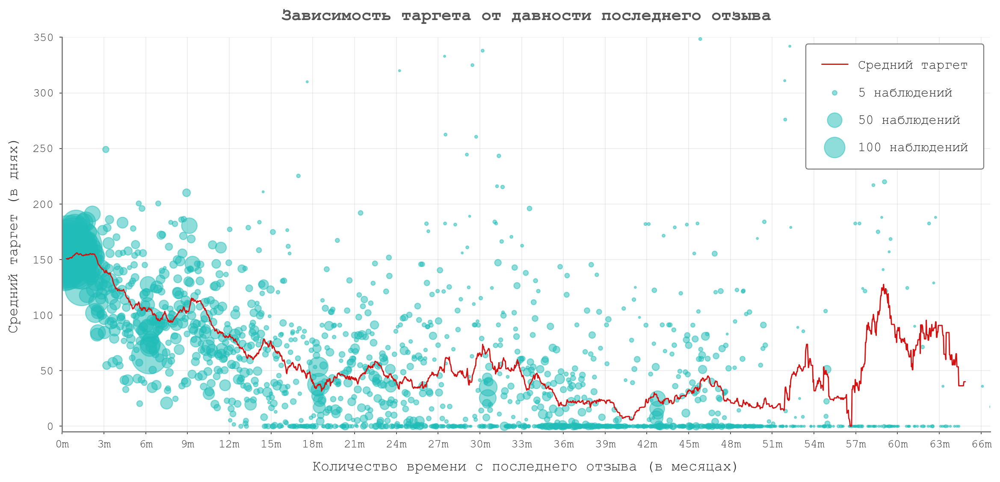

In [26]:
fig, ax = plt.subplots(figsize=(14, 6))

grouped = (df_train[df_train['days_since_last_review'] != -1]
    .groupby('days_since_last_review')['target'].agg(['mean', 'count']))

# полный диапазон дней
days_range = range(int(grouped.index.min()), int(grouped.index.max()) + 1)
grouped_full = grouped.reindex(days_range)

# сглаживание
smooth = grouped_full['mean'].rolling(50, min_periods=10).mean()

# линия
ax.plot(smooth, color=dimred, linewidth=1, label="Средний таргет")

# точки по агрегатам
ax.scatter(
    grouped.index,
    grouped['mean'],
    s=grouped['count']*3 ,   
    alpha=0.5,
    color=box,
)

# легенда для scatter
for size in [5, 50, 100]:
    ax.scatter([], [], s=size*3, color=box, alpha=0.5,
               label=f'{size} наблюдений')

ax.legend(loc='upper right',
    frameon=True, facecolor='white', framealpha=1,
    edgecolor='#777777', borderpad=1.2,
    labelspacing=1.2)

# месяцы на оси Х
ticks = np.arange(0, 2001, 90)
labels = [f"{int(x/30)}m" for x in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(f"{int(x/30)}m" for x in ticks)

ax.set_xlim(0, 2000)
ax.set_ylim(-5, 350)

ax.set_title("Зависимость таргета от давности последнего отзыва")
ax.set_xlabel("Количество времени с последнего отзыва (в месяцах)")
ax.set_ylabel("Средний таргет (в днях)")

plt.show()

В пределах 1-1.5 лет со дня последнего отзыва есть определенная взаимосвязь давности отзыва и таргета: объекты с недавней активностью лучше сдаются. Похоже что отзывы в пределах 2 месяцев влияют одинаково – средняя линия держится на уровне около 150-160 (это близко к медиане таргета без учета нулевых значений = 167). Дальше идет довольно плавный спад, но в пределах 12 месяцев практически нет нулевых значений таргета. То есть если объект действительно сдается, то его снимают. После давности отзыва 12 месяцев есть наблюдения с разными значениями таргета, в том числе большими (долгосрочная аренда), но выделяется отдельный кластер объектов с нулевым таргетом, лежащих на оси Х. Вероятно именно эти объекты создают большой пик распределения в 0, то есть они есть в базе, но по факту не сдаются.

---

#### Числовые признаки

In [27]:
num_cols

['sum', 'min_days', 'amt_reviews', 'avg_reviews', 'total_host']

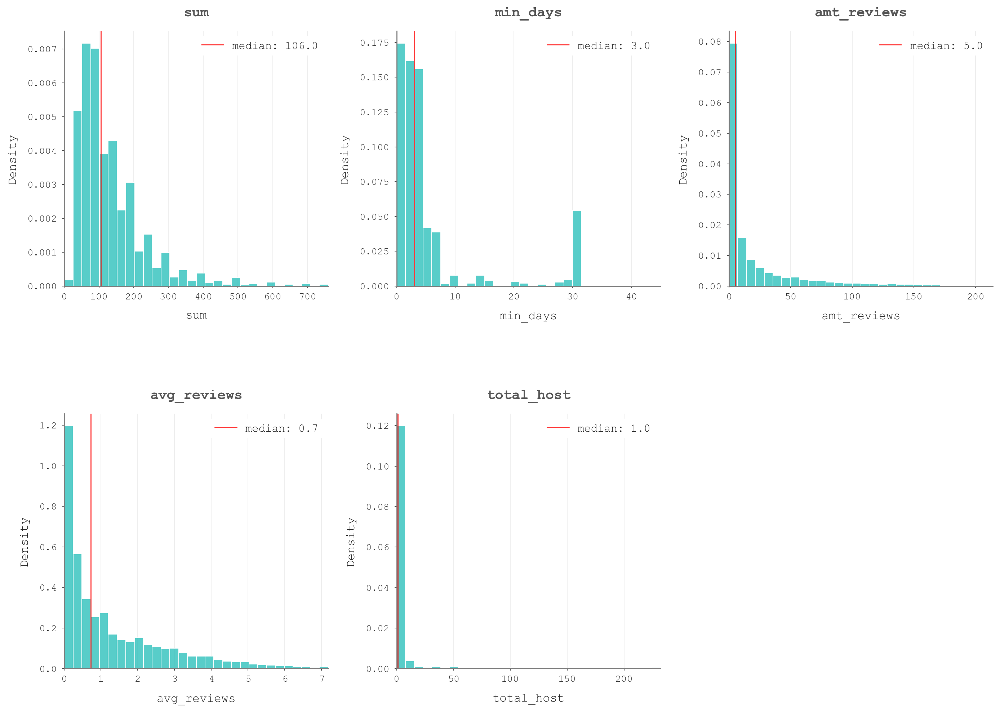

In [28]:
fig, axes = plt.subplots(2, 3, figsize=(14, 10))

# для всех признаков в num_cols
for i, col in enumerate(num_cols):
    ax = axes.flatten()[i]

    # 99 квантиль
    q99 = df_train[col].quantile(0.99)

    # histplot по всему датафрейму, динамические бины
    sns.histplot(df_train[col], stat='density', 
        bins=30, binrange=(0, q99), ax=ax)

    # лимит оси по 99 квантилю
    ax.set_xlim(0, q99)

    # медианы
    median = df_train[col].median()
    ax.axvline(median, color='red', lw=1, alpha=0.8,
               label=f"median: {median:.1f}")

    ax.set_title(col)
    ax.grid(axis='y', visible=False)
    ax.legend(frameon=True, facecolor='white', edgecolor='white', framealpha=1,)

# убрать пустой график
for j in range(len(num_cols), 6):
    axes.flatten()[j].axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.5)
plt.show()

- sum: большинство значений в диапазоне ~25–200, распределение с длинным правым хвостом. Есть редкие выбросы высоких значений.

- min_days: в основном 1–5 дней, распределение сильно скошено вправо. Отдельный пик на 30 дней (помесячная аренда).

- amt_reviews: много объектов с небольшим количеством отзывов, распределение с длинным хвостом. Есть отдельные объекты с очень большим числом отзывов.

- avg_reviews: большинство значений низкие (до ~2), распределение правосторонне асимметричное. Более высокие значения встречаются редко.

- total_host: у большинства хостов мало объектов, распределение сильно скошено вправо. Есть небольшое количество хостов с большим числом объектов.

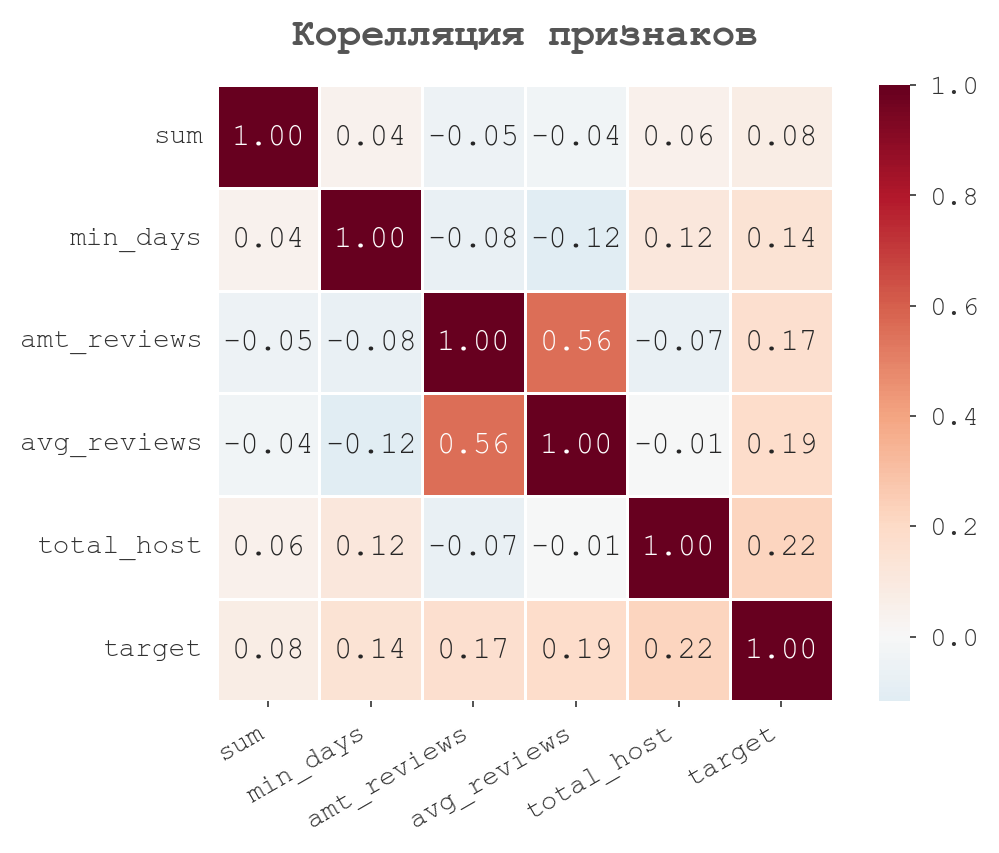

In [29]:
corr = df_train[num_cols+['target']].corr()

plt.figure(figsize=(6, 4))
ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    square=True,            
    linewidths=0.5
)
ax.tick_params(axis='y', length=0)
plt.xticks(rotation=30, ha='right')
plt.title("Корелляция признаков")
plt.show()

- sum: практически не связан с другими признаками и таргетом (корреляции близки к нулю). 
- min_days: слабая положительная связь с таргетом (~0.14). Также немного связан с total_host, влияние слабое.
- amt_reviews: умеренная связь с avg_reviews (~0.56), что логично — признаки частично отражают одно и то же. С таргетом связь слабая (~0.17).
- avg_reviews: слабая положительная связь с таргетом (~0.19). Один из более информативных признаков, но эффект не большой.
- total_host: самая высокая корреляция с таргетом (~0.22) среди всех признаков.
- target: ни с одним признаком нет сильной линейной зависимости. Все корреляции слабые (<0.25), возможна нелинейность или влияние комбинаций признаков.

----

#### Категориальные признаки

In [30]:
cat_cols

['location_cluster', 'location', 'type_house']

##### 1. 'location_cluster'

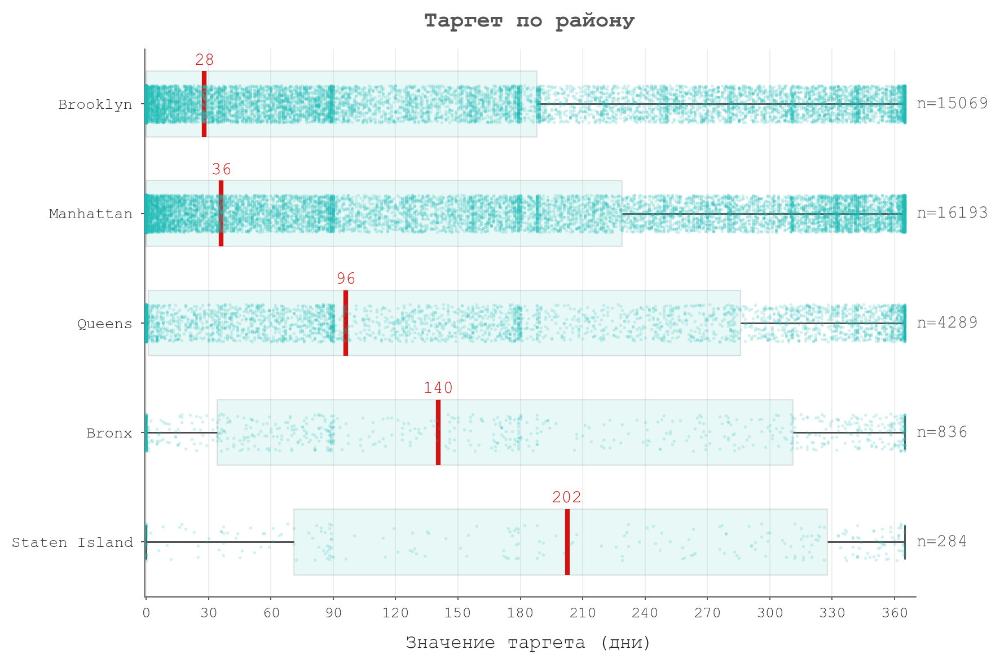

In [31]:
fig, ax = plt.subplots(figsize=(9, 6))

# порядок кластеров по медиане
order = (df_train.groupby('location_cluster')['target']
    .median().sort_values().index)

# boxplot
sns.boxplot(data=df_train,
    y='location_cluster', x='target', order=order,
    width=0.6, ax=ax,
    medianprops=dict(color=dimred, linewidth=3),
    boxprops=dict(facecolor=box, edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
)

# stripplot
sns.stripplot(data=df_train,
    x='target', y='location_cluster', order=order,
    color=box, jitter=0.17, alpha=0.2, size=2, ax=ax)

# медианы
medians = (df_train.groupby('location_cluster')['target']
    .median().reindex(order))

for i, val in enumerate(medians):
    ax.text(val, i - 0.40,
        f"{val:.0f}", va='center', ha='center',
        fontsize=11, color=dimred)

# количество объектов
counts = df_train['location_cluster'].value_counts().reindex(order)

x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.015, i,
        f"n={counts[cat]}", va='center',
        fontsize=11, color='#555555')

ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Таргет по району")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

plt.tight_layout()
plt.show()

Распределение таргета по району показывает что район не релевантен как признак и не несет особой информации. Во всех районах распределения таргета похожи – широкий разброс значений во всем диапазоне. Внутри каждого района распределение таргета выглядит достаточно равномерно. Чуть больше наблюдений в хвостах распределений чем в середине, но это консистентно между кластерами локаций. Есть отдельные уплотнения в виде вертикальных скоплений точек в одних и тех же местах на уровне например 3 месяца, 6 месяцев, но этот паттерн так же одинаков по всем районам.

Основное различие между районами – в количестве наблюдений. Категории кластеров представлены неравномерно, Бруклин и Манхеттен содержат больше 15000 объектов каждый, а Бронкс и Стейтен-Айленд всего 836 и 284 соответственно.

In [32]:
train_dist = df_train['location_cluster'].value_counts(normalize=True)
test_dist = df_test['location_cluster'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
location_cluster,,
Manhattan,0.442,0.447
Brooklyn,0.411,0.412
Queens,0.117,0.113
Bronx,0.023,0.021
Staten Island,0.008,0.007


Распределение 'location_cluster' в train и test совпадает. Этот признак дублирует географическую информацию (latitude, longitude).

##### 2. 'location'

In [33]:
df_train.groupby('location_cluster')['location'].nunique()

location_cluster
Bronx            48
Brooklyn         47
Manhattan        32
Queens           51
Staten Island    42
Name: location, dtype: int64

In [34]:
print(f"Всего уникальных location: {df_train['location'].nunique()}")
print(f"location присутствуют больше чем в одном кластере: {(df_train.groupby('location')['location_cluster'].nunique() > 1).sum()}")

Всего уникальных location: 220
location присутствуют больше чем в одном кластере: 0


location_cluster агрегирует location в группы, т.е. location это мелкая детализация внутри района.

##### 3. 'type_house'

In [35]:
train_dist = df_train['type_house'].value_counts(normalize=True)
test_dist = df_test['type_house'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
type_house,,
Entire home/apt,0.518,0.523
Private room,0.458,0.453
Shared room,0.024,0.023


Распределение 'type_house' в train и test совпадает, сдвига распределения в этих выборках нет. Доля shared_room всего ~2%, категории представлены неравномерно.

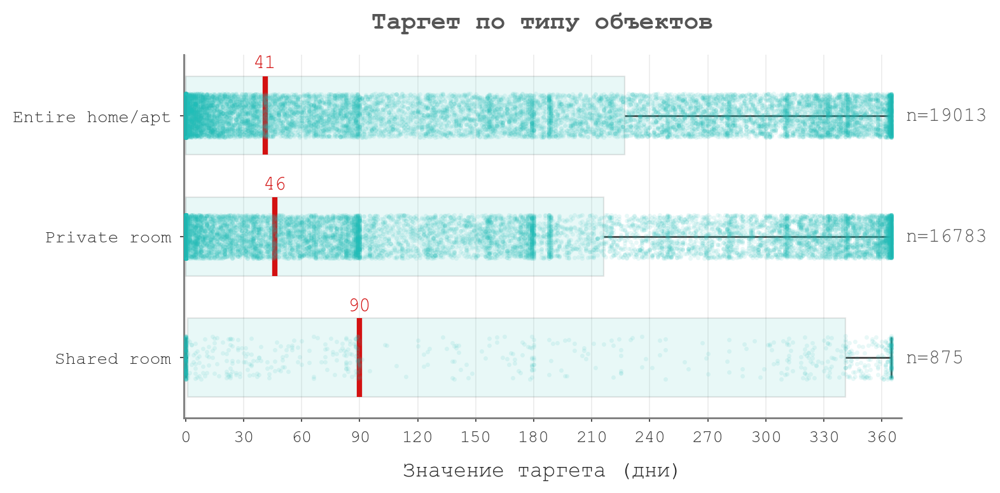

In [36]:
fig, ax = plt.subplots(figsize=(8, 4))

# порядок категорий
order = df_train['type_house'].value_counts().index

# boxplot
sns.boxplot(data=df_train, y='type_house', x='target',
    order=order, width=0.65, ax=ax, 
    medianprops=dict(color=dimred, linewidth=3, alpha=1), 
    boxprops=dict(facecolor=box, edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
    )

# stripplot
sns.stripplot(data=df_train,
    x='target', y='type_house',
    order=order, color=box, jitter=0.18,
    alpha=0.1, size=2.5, ax=ax)

# медианы
medians = df_train.groupby('type_house')['target'].median().reindex(order)

for i, val in enumerate(medians):
    ax.text(val, i-0.43, f"{val:.0f}",
        va='center', ha='center',
        fontsize=11, color=dimred)

# количество наблюдений
counts = df_train['type_house'].value_counts().reindex(order)
x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.02, i,
        f"n={counts[cat]}",
        va='center', fontsize=11,
        color='#555555')
    
ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Таргет по типу объектов")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

plt.tight_layout()
plt.show()

Несмотря на более высокую медиану в категории shared_room, учитывая долю наблюдений всего ~2%, выводов о более высокой загрузке этого типа объектов сделать нельзя. По категориям entire home/apt и private room распределения сильно перекрываются, разброс внутри категорий большой – связь с таргетом слабая. Видны отдельные вертикальные кластеры точек например на значении таргета 3 месяца и 6 месяцев. Распределение таргета по типам объектов имеет примерно похожую структуру, но категории неравномерны по количеству объектов.

----

#### Гео признаки

In [37]:
import plotly.express as px

fig = px.scatter_mapbox(
    df_train,
    lat="lat",
    lon="lon",
    color="target",
    hover_name="name",
    hover_data=[
        'sum',
        'min_days',
        'amt_reviews',
        'avg_reviews',
        'total_host',
        'days_since_last_review'
    ],
    zoom=9.5,
    height=700,
    width=700,  
    color_continuous_scale="Viridis",
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

/opt/anaconda3/lib/python3.13/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




<p align="left" style="color: #949494; font-size: 12px;">
  <em>[ Plotly map screenshot ]</em>
</p>

<p align="left">
  <img src="utils/plotly_map.jpg" alt="Plotly map screenshot" width="900">
</p>


Высокие/низкие значения таргета не формирут четких кластеров и рассеяны по всем районам города. Внутри каждого района высокая вариативность таргета.

---

#### ID признаки

In [38]:
id_cols

['_id', 'name', 'host_name']

In [39]:
df_train.head(10)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,avg_reviews,total_host,target,is_zero_days,days_since_last_review
0,Belle Harbor 4 BR 2 bath- 1 bl from Beach,40327248,Sarina,Queens,Neponsit,40.57215,-73.85822,Entire home/apt,350,2,5,2.88,1,334,0,1.0
1,"Come see Brooklyn, New York",13617520,Howard T.,Brooklyn,Clinton Hill,40.69172,-73.96934,Shared room,40,5,8,0.13,1,0,1,1594.0
2,Large 2Br on W71st & Columbus Feb 19-28,26754726,Julie,Manhattan,Upper West Side,40.77673,-73.98011,Entire home/apt,200,5,0,NaN,1,0,1,-1.0
3,Perfect bedroom. Near Subways Columbia CityCol...,16721721,Federico,Manhattan,Harlem,40.81530,-73.95080,Private room,65,2,18,0.64,1,0,1,246.0
4,Cozy Sun Filled Fresh Guest Room in Artsy Bush...,22246463,Lisa,Brooklyn,Bushwick,40.70230,-73.92935,Private room,99,2,26,0.76,1,155,0,15.0
5,Comfortable Duplex Studio with Balcony! Near t...,120643397,Rachel,Brooklyn,Midwood,40.62258,-73.97398,Entire home/apt,139,2,41,3.70,1,62,0,1.0
6,Simple PRIVATE ROOM in UNION SQUARE,88073013,Rui,Manhattan,Gramercy,40.73421,-73.98834,Private room,85,2,47,1.32,1,18,0,34.0
7,RENOVATED 2 BEDROOM APT NEAR CENTRAL PARK WEST,9293730,Inna,Manhattan,Upper West Side,40.79638,-73.96332,Entire home/apt,125,30,1,0.09,16,284,0,338.0
8,"Charming, spacious UES studio",19529891,Shilpa,Manhattan,Upper East Side,40.76870,-73.95560,Entire home/apt,135,3,0,NaN,1,0,1,-1.0
9,Beautiful garden apartment,88111418,Micheline,Queens,St. Albans,40.69113,-73.75524,Entire home/apt,70,3,12,1.31,1,323,0,18.0


host_name не уникален, это могут быть разные люди с одинаковым именем. Практической информации для моделей из этого признака извлечь нельзя. 

In [40]:
print("Объектов в train:", df_train.shape[0])
print("Объектов в test:", df_test.shape[0], "\n")

print("Пересечение ID в train и test:", len(set(df_train['_id']) & set(df_test['_id'])))
print("Пересечение 'host_name' в train и test:", len(set(df_train['host_name']) & set(df_test['host_name'])), "\n")

print("1 id > 1 host:", (df_train.groupby('_id')['host_name'].nunique() > 1).sum())
print("1 id > 1 listing name:", (df_train.groupby('_id')['name'].nunique() > 1).sum())

print(
    f"\nДоля одинаковых id с разными координатами объектов (lat / lon): "
    f"{(df_train.groupby('_id')[['lat','lon']].nunique().max(axis=1) > 1).mean():.2%}"
)

Объектов в train: 36671
Объектов в test: 12224 

Пересечение ID в train и test: 2447
Пересечение 'host_name' в train и test: 2840 

1 id > 1 host: 0
1 id > 1 listing name: 3461

Доля одинаковых id с разными координатами объектов (lat / lon): 12.03%


В train и test выборках есть пересечения признаков _id (2447 совпадений) и host_name (2840 совпадений). Примерно каждый пятый объект из test встречается и в train. Эти признаки нельзя использовать в модели напрямую, так как есть пересечения в выборках train и тест, может быть утечка данных.

Для каждого значения _id соответствует не более одного host_name, и на одном id может быть более одного объекта (3461 случаев), при этом в 12% случаев гео.координаты этих объектов не совпадают. 

---

# Data preprocessing

## Target binning for stratification

In [41]:
# df_train_original - оригинальный датасет (скопирован до EDA)

# разбиение на 5 бинов
bins = pd.qcut(
    df_train_original['target'],
    5,
    duplicates='drop'
)

# идентификаторы бинов - в датафрейм
df_train_original['target_bin'] = bins.cat.codes

# границы бинов - для графика
print(bins.cat.categories)

IntervalIndex([(-0.001, 8.0], (8.0, 93.0], (93.0, 272.0], (272.0, 365.0]], dtype='interval[float64, right]')


**qcut** разбивает массив данных на сегменты одинакового размера по квантилям (5 бинов: 0-20% наблюдений, 20-40%, 40-60%, 60-80%, 80-100%). В датасете 37% одинаковых значений таргета =0, смежные границы первого и второго бина имели бы значение 0. qcut не может делить одинаковые значения на несколько бинов, поэтому дублирующие границы удаляются (бины 1 и 2 схлопываются вместе). Поэтому бинов стало меньше (4 вместо 5).

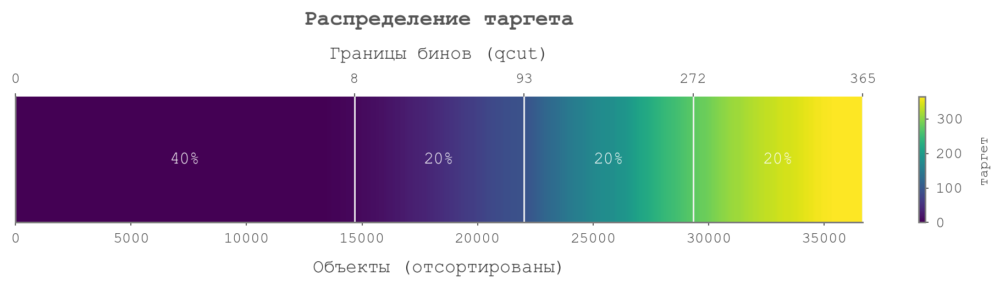

In [42]:
# данные для графика
target = df_train_original['target'].values
sorted_target = np.sort(target)

# границы бинов
categories = bins.cat.categories
edges = [categories[0].left] + [interval.right for interval in categories]
edges[0] = 0  

# позиции на оси X
positions = [
    np.searchsorted(sorted_target, edge) if edge != edges[-1]
    else len(sorted_target) - 1
    for edge in edges
]

# counts по бинам 
counts = pd.Series(bins).value_counts().sort_index()
shares = counts / len(target)

# =====================================================
fig, ax = plt.subplots(figsize=(9, 2.5), constrained_layout=True)

im = ax.imshow(sorted_target.reshape(1, -1), aspect='auto',  cmap='viridis')

ax.grid(False)
ax.set_yticks([])
ax.set_xlabel("Объекты (отсортированы)")
ax.set_title("Распределение таргета")

# линии границ бинов
for pos in positions:
    ax.axvline(pos, color='white', linestyle='-', lw=1, alpha=1)

# верхняя ось (границы бинов) 
ax_top = ax.twiny()
ax_top.set_xlim(ax.get_xlim())

ax_top.set_xticks(positions)
ax_top.set_xticklabels([f"{int(e)}" for e in edges])
ax_top.set_xlabel("Границы бинов (qcut)")

# подписи по центру бинов 
for i in range(len(positions) - 1):
    left = positions[i]
    right = positions[i + 1]
    x_center = (left + right) / 2

    share = shares.iloc[i]

    ax.text(x_center, 0.5, f"{share:.0%}", fontsize=11,
        ha='center', va='center', color='white',
        transform=ax.get_xaxis_transform())

# colorbar 
cbar = fig.colorbar(im, ax=ax)
cbar.set_label("таргет", fontsize=9)

plt.show()

In [43]:
# диагностика баланса таргета в бинах после skf
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

print("\n=== StratifiedKFold ===")

for i, (_, val_idx) in enumerate(skf.split(df_train_original, df_train_original['target_bin'])):
    y_val = df_train_original.iloc[val_idx]['target']
    print(f"Fold {i}: mean={y_val.mean():.2f}, zeros={(y_val==0).mean():.2f}")


=== StratifiedKFold ===
Fold 0: mean=112.70, zeros=0.36
Fold 1: mean=112.58, zeros=0.36
Fold 2: mean=113.23, zeros=0.36
Fold 3: mean=112.54, zeros=0.36
Fold 4: mean=112.78, zeros=0.36


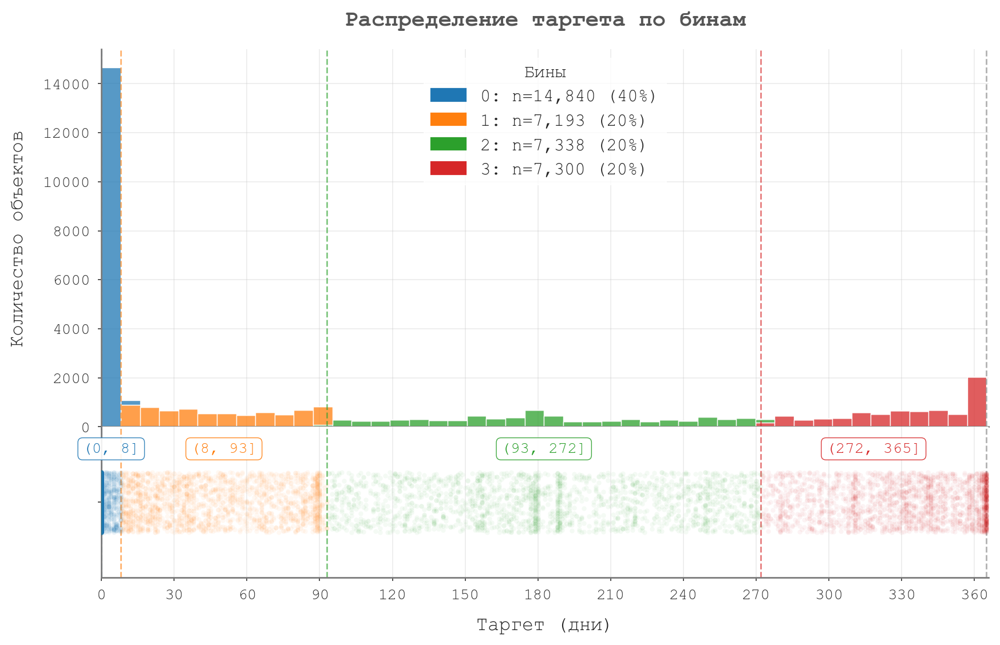

In [44]:
from matplotlib.patches import Patch

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True,
    gridspec_kw={'height_ratios': [1, 0.4], 'hspace': 0})

# bins 
categories = bins.cat.categories
bin_edges = [cat.left for cat in categories] + [categories[-1].right]

# counts
counts = df_train_original['target_bin'].value_counts().sort_index()
total = len(df_train_original)

palette = sns.color_palette('tab10', n_colors=len(categories))

# HISTPLOT -----------------
ax = axes[0]

sns.histplot(data=df_train_original, x='target', hue='target_bin',
    multiple='stack', bins=46, legend=False, ax=ax,
    edgecolor='white', linewidth=0.5, palette=palette)

# легенда
legend_elements = [
    Patch(
        facecolor=palette[i],
        edgecolor=palette[i],
        label=f"{i}: n={counts[i]:,} ({counts[i]/total:.0%})"
    )
    for i in counts.index
]

ax.legend(handles=legend_elements, title="Бины",
    loc='upper center', ncol=1,
    frameon=True, facecolor='white', edgecolor='white')

ax.set_ylabel("Количество объектов")
ax.set_title("Распределение таргета по бинам")


# STRIPPLOT --------------------
sample = df_train_original.sample(10000, random_state=42)

for i, (interval, color) in enumerate(zip(categories, palette)):
    # точки из i-того бина
    sns.stripplot(
        data=sample[sample['target_bin'] == i], x='target',
        color=color, jitter=0.2, alpha=0.05, size=3, ax=axes[1])

    # границы бина
    left = max(0, interval.left)
    right = interval.right

    # центр интервала
    x_center = (interval.left + interval.right) / 2

    # аннотация
    axes[1].annotate(f"({left:.0f}, {right:.0f}]",
        xy=(x_center, 0.8), xycoords=('data', 'axes fraction'),
        xytext=(0, 3), textcoords='offset points',
        ha='center', fontsize=10, color=color,
        bbox=dict(boxstyle='round,pad=0.3',
            facecolor='white', edgecolor=color, lw=0.5, alpha=0.9)
        )

# линии границ бинов
for i, edge in enumerate(bin_edges[:-1]):
    for ax in axes:
        ax.axvline(edge, color=palette[i], linestyle='--', lw=1, alpha=0.6)

for ax in axes:
    ax.axvline(bin_edges[-1], color='gray', linestyle='--', lw=1, alpha=0.6)

axes[1].set_xlabel("Таргет (дни)")

plt.xticks(np.arange(0, 366, 30))
plt.xlim(0, 366)

plt.subplots_adjust(hspace=0)
plt.show()

**Разделение на бины для Stratified KFold**\
Из-за большого количества нулей квантильные границы совпадают, поэтому qcut не может разделить данные на 5 равных частей и уменьшает число бинов до 4. В первый бин попадают все нули и часть малых значений (~40%), остальные бины содержат примерно по 20% наблюдений.

----

## Features

### Feature engineering

In [45]:
df_train_original.dtypes
# df_train.columns.to_list()

name                 object
_id                   int64
host_name            object
location_cluster     object
location             object
lat                 float64
lon                 float64
type_house           object
sum                   int64
min_days              int64
amt_reviews           int64
last_dt              object
avg_reviews         float64
total_host            int64
target                int64
target_bin             int8
dtype: object

In [46]:
# создание обучающего и тестового наборов данных

X_full = df_train_original.drop(columns=['target', 'target_bin']).copy()
y_full = df_train_original['target'].copy()
target_bin = df_train_original['target_bin'].copy()

X_test = df_test_original.copy()

# заполнение пропусков в avg_reviews нулями
X_full['avg_reviews'] = X_full['avg_reviews'].fillna(0)
X_test['avg_reviews'] = X_test['avg_reviews'].fillna(0)

# совпадает ли количество признаков в train и test
assert X_full.shape[1] == X_test.shape[1]

In [47]:
# совпадает ли количество строк в X_train_full и y
assert (X_full.index == y_full.index).all()

#### Date columns

In [48]:
# преобразование last_dt в datetime с обработкой ошибок
X_full['last_dt'] = pd.to_datetime(X_full['last_dt'], errors='coerce')
X_test['last_dt'] = pd.to_datetime(X_test['last_dt'], errors='coerce')

# дата самого последнего отзыва
max_date = X_full['last_dt'].max()

# новый признак для давности последнего отзыва
X_full['days_since_last_review'] = (max_date - X_full['last_dt']).dt.days
X_test['days_since_last_review'] = (max_date - X_test['last_dt']).dt.days

# заполнение пропусков в days_since_last_review значением -1, чтобы не смешивать с реальными 0
X_full['days_since_last_review'] = X_full['days_since_last_review'].fillna(-1)
X_test['days_since_last_review'] = X_test['days_since_last_review'].fillna(-1)

# удаление столбца last_dt, так как он больше не нужен  
X_full.drop(columns='last_dt', inplace=True)
X_test.drop(columns='last_dt', inplace=True)

'last_dt' преобразована в числовой признак 'days_since_last_review'

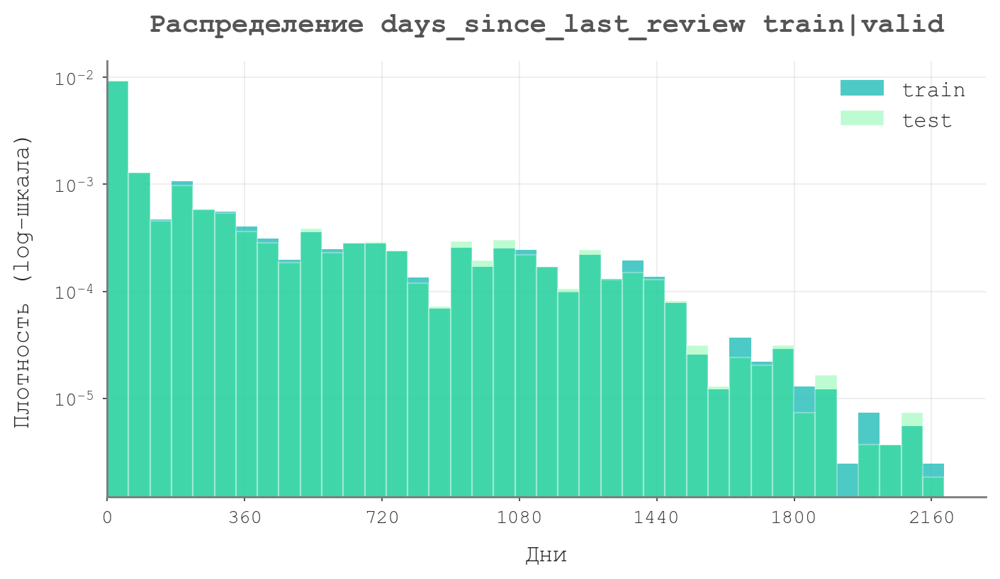

In [49]:
# сравнение распределений 'days_since_last_review' в train и test
bins = np.linspace(0, X_full['days_since_last_review'].quantile(0.999), 40)

X_full['days_since_last_review'].hist(bins=bins, density=True, alpha=0.8, label='train', color=box)
X_test['days_since_last_review'].hist(bins=bins, density=True, alpha=0.3, label='test', color="#26F46A", edgecolor='white')

# лог-шкала чтобы были лучше видны ненулевые значения
plt.yscale('log')
plt.xlim(xmin=0)
plt.legend()
plt.xticks(np.arange(0,2200,360))
plt.xlabel('Дни')
plt.ylabel('Плотность (log-шкала)')
plt.title('Распределение days_since_last_review train|valid')
plt.show()

Распределения в целом похожи, пик около 0, похожая асимметрия. В train больше экстремальных значений (>2000), диапазон значений шире.

#### Geo features

In [50]:
geo_cols

['lat', 'lon']

In [51]:
# bearing degree
def bearing_degree(lat, lon, base_lat=0, base_lon=0):
    phi1 = math.radians(base_lat)
    phi2 = math.radians(lat)
    dlon = math.radians(lon - base_lon)
    x = math.sin(dlon) * math.cos(phi2)
    y = math.cos(phi1) * math.sin(phi2) - math.sin(phi1) * math.cos(phi2) * math.cos(dlon)
    degree = (math.degrees(math.atan2(x, y)) + 360) % 360
    return degree

# haversine distance
def haversine_distance(lat, lon, base_lat=0, base_lon=0):
    R = 6371.0  # км
    phi1 = math.radians(base_lat)
    phi2 = math.radians(lat)
    dphi = math.radians(lat - base_lat)
    dlon = math.radians(lon - base_lon)
    a = math.sin(dphi / 2) ** 2 + math.cos(phi1) * math.cos(phi2) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(max(0.0, 1.0 - a)))
    distance = R * c
    return distance

In [52]:
# середина города по координатам из train
base_lat = df_train['lat'].mean()
base_lon = df_train['lon'].mean()
    
# добавление 'bearing_degree'
X_full['bearing_degree'] = X_full.apply(lambda x: bearing_degree(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)
X_test['bearing_degree'] = X_test.apply(lambda x: bearing_degree(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)

# добавление 'haversine_distance'
X_full['haversine_distance'] = X_full.apply(lambda x: haversine_distance(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)
X_test['haversine_distance'] = X_test.apply(lambda x: haversine_distance(x['lat'], x['lon'], base_lat=base_lat, base_lon=base_lon), axis=1)


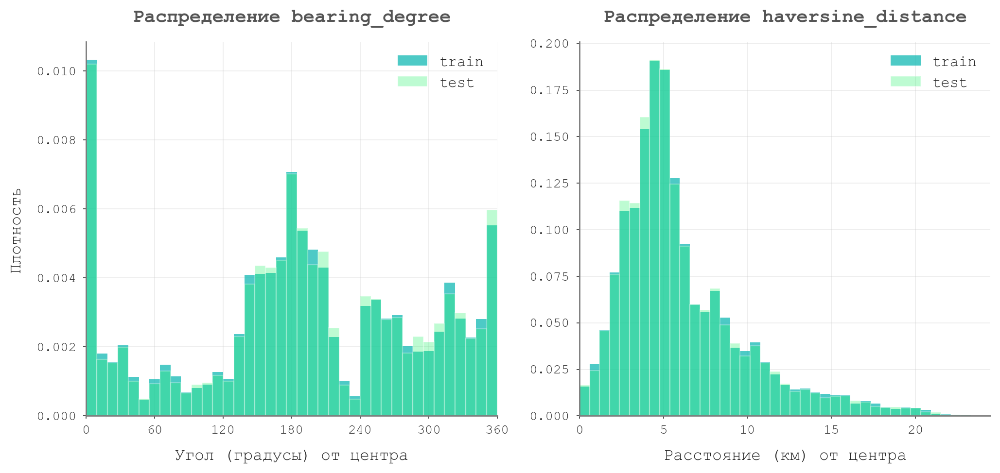

In [53]:
# сравнение распределений 'bearing_degree', 'haversine_distance' в train и test

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# bins
bins_b = np.linspace(0, 360, 40)
bins_h = np.linspace(0, X_full['haversine_distance'].quantile(0.999), 40)

# hist: bearing
X_full['bearing_degree'].hist(bins=bins_b, density=True, alpha=0.8, label='train', ax=axes[0])
X_test['bearing_degree'].hist(bins=bins_b, density=True, alpha=0.3, label='test', ax=axes[0], 
    color="#26F46A", edgecolor='white')

# hist: haverstine
X_full['haversine_distance'].hist(bins=bins_h, density=True, alpha=0.8, label='train', ax=axes[1])
X_test['haversine_distance'].hist(bins=bins_h, density=True, alpha=0.3, label='test', ax=axes[1],
    color="#26F46A", edgecolor='white')

axes[0].set_title('Распределение bearing_degree')
axes[1].set_title('Распределение haversine_distance')

axes[0].set_xlim(0, 360)
axes[0].set_xticks(np.arange(0, 361, 60))
axes[1].set_xlim(left=0)

axes[0].set_ylabel('Плотность')
axes[0].set_xlabel('Угол (градусы) от центра')
axes[1].set_xlabel('Расстояние (км) от центра')

axes[0].legend()
axes[1].legend()
plt.show()

Распределения гео.признаков в обучающей и тестовой выборках совпадают.

#### ID features

In [54]:
id_cols

['_id', 'name', 'host_name']

In [55]:
# удаляем id-признаки из выборок
X_full.drop(columns=id_cols, inplace=True)
X_test.drop(columns=id_cols, inplace=True)

#### Categorical features

In [56]:
cat_cols

['location_cluster', 'location', 'type_house']

In [57]:
for col in cat_cols:
    X_full[col] = X_full[col].astype('category')
    X_test[col] = X_test[col].astype('category')

По результатам исследования feature selection эти признаки используются большинством моделей минимально и не улучшают метрику MSE.
Часть моделей могут извлечь из них дополнительную информацию судя по улучшению метрик, поэтому оставлю их в датасете для возможности точечного добавления в отдельные модели.

#### Numerical features

In [58]:
num_cols

['sum', 'min_days', 'amt_reviews', 'avg_reviews', 'total_host']

Числовые признаки пойдут в модель без изменений.

In [59]:
print(f"Пропуски в train: {X_full.isna().sum()[X_full.isna().sum() > 0].sort_values(ascending=False)}")
print(f"Пропуски в test: {X_test.isna().sum()[X_test.isna().sum() > 0].sort_values(ascending=False)}")


Пропуски в train: Series([], dtype: int64)
Пропуски в test: Series([], dtype: int64)


#### Выводы

По результатам нескольких экспериментов по feature engineering и feature selection для бустинговых моделей получены выводы:

1. Клиппинг числовых признаков по 99% квантилю ухудшил метрику MSE для всех моделей (XGBoost, LightGBM, CatBoost, Random Forest). Экстремальные значения не  шум, и содержат полезную для предсказаний информацию.

2. бинарные признаки
- 'no_reviews_flag' (AV = 0.50, feature_gain = 0.000, permutation = -0.000) — не используется моделями, дублирует days_since_last_review
- 'is_business_host' (AV = 0.49, feature_gain = 0.000, permutation = 0.000) – не используется, не улучшает качество предсказания

3. log-трансформация признаков с длинным правым хвостом в распределениях ('total_host_log', 'amt_reviews_log') не влияет на качество предсказания и метрики MSE. SHAP-анализ показал, что преобразованные признаки не используются, в то же время исходные признаки остаются информативными. Бустинговые модели используют порядок значений, а логарифм является монотонным преобразованием, не изменяющим структуру разбиений.

4. Interaction признаки
- 'reviews_recent' = amt_reviews / (days_since_last_review + 1) – высокий вклад по SHAP, но это не привело к улучшению метрики MSE
- 'host_activity' = total_host * reviews_recent  – не улучшил качество предсказаний моделей.
Бустинговые модели способны автоматически моделировать нелинейные зависимости и взаимодействия между признаками, явное добавление этих признаков привЕло к дублированию информации и ухудшению обобщающей способности.

5. Удаление категориальных признаков 'location', 'type_house', 'location_cluster' иногда приводит к улучшению метрик для части моделей. 

По результатам экспериментов основной вклад в качество модели вносят исходные числовые признаки без дополнительных преобразований. Попытки усложнить модель за счeт feature engineering (клиппинг, логарифмирование, interaction-признаки) не привели к улучшению качества и иногда ухудшили метрики.

---

### Feature selection

In [60]:
from lightgbm import LGBMRegressor
from category_encoders.cat_boost import CatBoostEncoder
from catboost import CatBoostRegressor
from eli5.sklearn import PermutationImportance
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from sklearn.model_selection import train_test_split

import eli5

In [61]:
X_full.columns.to_list()

['location_cluster',
 'location',
 'lat',
 'lon',
 'type_house',
 'sum',
 'min_days',
 'amt_reviews',
 'avg_reviews',
 'total_host',
 'days_since_last_review',
 'bearing_degree',
 'haversine_distance']

In [62]:
features = [
    'location_cluster',
    'location',
    'lat',
    'lon',
    'type_house',
    'sum',
    'min_days',
    'amt_reviews',
    'avg_reviews',
    'total_host',
    'days_since_last_review',
    'bearing_degree',
    'haversine_distance',
    ]

# категориальные признаки для encoder          
cat_features = [
    'location_cluster', 
    'location', 
    'type_house',
    ]


По результатам нескольких экспериментов с Adversarial Validation, Feature Importance и Permutation Importance признаки, не дающие вклада в модель:

- location: AV = 0.96, feature_gain = 0.042, permutation = 0.014 — высокий AV, низкий вклад
- type_house: AV = 0.96, feature_gain = 0.020, permutation = 0.006 — слабый сигнал
- location_cluster: AV = 0.93, feature_gain = 0.019, permutation = 0.011 — низкий вклад, избыточный гео-признак

Некоторые модели могу извлечь дополнительный сигнал из части этих признаков, можно попробовать разные комбинации.

In [63]:
# полный обучающий датасет с выбранными фичами
X_full = X_full[features].copy()
X_test = X_test[features].copy()

assert X_full.shape[1] == X_test.shape[1]

---

##### **Stratified  test/valid split** для feature importance

In [64]:
# для feature importance достаточно одного сплита
X_train, X_valid, y_train, y_valid = train_test_split(
    X_full,
    y_full,
    test_size=0.2,
    random_state=1,
    stratify=target_bin     # stratify по бинам таргета
)

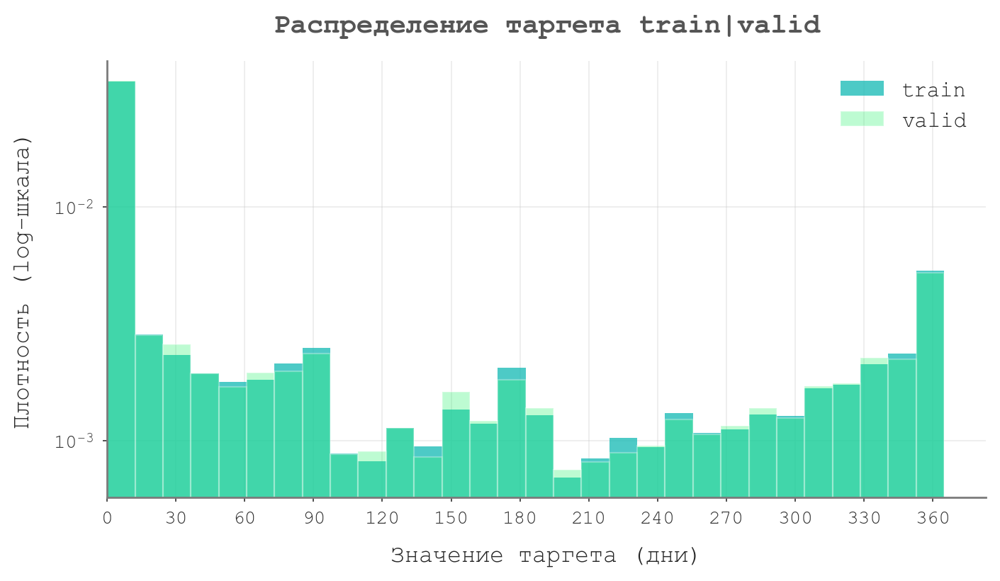

In [65]:
plt.figure(figsize=(8,4))

# сравнение распределений таргета в train и validation

y_train.hist(bins=30, density=True, alpha=0.8, label='train')
y_valid.hist(bins=30, density=True, alpha=0.3, label='valid',
    color="#26F46A", edgecolor='white')

# лог-шкала чтобы были лучше видны ненулевые значения
plt.yscale('log')
plt.xlim(xmin=0)

plt.ylabel('Плотность (log-шкала)')
plt.xlabel('Значение таргета (дни)')

plt.xticks(np.arange(0,366,30))

plt.legend()
plt.title('Распределение таргета train|valid')
plt.show()


На гистплоте после разделения обучающей выборки на test и validation распределение таргета осталось одинаковым в обеих выборках.\
Численно по долям:

In [66]:
train_dist = (pd.Series(target_bin)
    .iloc[y_train.index]                         # только те строки, которые попали в train
    .value_counts(normalize=True).sort_index()   # normalize=True - доля бина в таргете
    )

valid_dist = pd.Series(target_bin).iloc[y_valid.index].value_counts(normalize=True).sort_index()

print(pd.DataFrame({
    'train': train_dist,
    'valid': valid_dist
}))

               train     valid
target_bin                    
0           0.404690  0.404635
1           0.196141  0.196183
2           0.200095  0.200136
3           0.199073  0.199046


Распределение target_bin совпало практически идеально. Stratify сработал корректно, train и valid репрезентативны.

---

##### **Adversarial Validation Score**

Adversarial Validation Score показывает, насколько train и test отличаются по признакам. Используется для диагностики сдвига распределений (distribution shift), который может ухудшать обобщающую способность модели.

Создается вспомогательная задача классификации:
1. Объединяются данные train и test
2. Объектам из train присваивается метка 0, из test — 1
3. Бинарный классификатор (например, LGBMClassifier) обучается различать выборки
4. Вычисляется AV score (ROC AUC)

ROC AUC ~ 0.5 означает, что модель не может отличить train от test, то есть распределения признаков практически совпадают.

In [67]:
from lightgbm import LGBMClassifier

In [68]:
# общий ROC AUC

# объединяем данные test и train
X_adv = pd.concat([X_test[features], X_full[features]]).reset_index(drop=True)

for col in cat_features:
    X_adv[col] = X_adv[col].astype('category')

# таргет: 1 = test, 0 = train
y_adv = np.hstack([
    np.ones(X_test.shape[0]),
    np.zeros(X_full.shape[0])
])

model = LGBMClassifier(n_estimators=100, max_depth=3, random_state=10, verbosity=-1)

adv_score = np.mean(
    cross_val_score(
        estimator=model,
        X=X_adv,
        y=y_adv,
        cv=5,
        scoring='roc_auc'
    )
)

print(f'Adversarial Validation Score: {adv_score:.2f} ROC AUC')

Adversarial Validation Score: 0.50 ROC AUC


Adversarial Validation Score: 0.50 ROC AUC – соответствует случайному угадыванию. Модель не может отличить train от test на основе доступных признаков, данные можно считать согласованными для обучения моделей.


In [69]:
# ROC AUC по признакам

results = []

for feature in features:

    # объединяем данные test и train по признакам
    X_feat = pd.concat(
        [X_test[[feature]], X_full[[feature]]]
    ).reset_index(drop=True)

    if feature in cat_features:
        X_feat[feature] = X_feat[feature].astype('category')

    # таргет: 1 = test, 0 = train
    y_adv = np.hstack([
        np.ones(X_test.shape[0]),
        np.zeros(X_full.shape[0])
    ])

    model = LGBMClassifier(n_estimators=100, max_depth=3, random_state=10, verbosity=-1)
    
    # расчет AV score
    adv_score = np.mean(
        cross_val_score(
            estimator=model,
            X=X_feat,
            y=y_adv,
            cv=5,
            scoring='roc_auc',
        )
    )

    results.append((feature, adv_score))

adv_df = pd.DataFrame(results, columns=['feature', 'adv_score'])
adv_df = adv_df.sort_values(by='adv_score', ascending=False)

print(adv_df.head(15))

                   feature  adv_score
11          bearing_degree   0.505586
8              avg_reviews   0.502979
5                      sum   0.502866
7              amt_reviews   0.501890
9               total_host   0.501834
10  days_since_last_review   0.501258
4               type_house   0.501085
0         location_cluster   0.500727
3                      lon   0.500399
1                 location   0.496978
6                 min_days   0.496760
12      haversine_distance   0.496279
2                      lat   0.496038


Признаки стабильны между train и test, различия незначительные.

-------

##### **Encoder** для категориальных фич

Encoding – после сплита, чтобы encoder не видел валидационные данные

**CatBoostEncoder** преобразует текст/категории в числа, основываясь на значениях целевой переменной (Target Encoding).\
Алгоритм CatBoostEncoder предотвращает data leakage (текущая строка "не видит" свой собственный таргет):
1. случайная перестановка данных в обучающей выборке
2. накопительное среднее: для каждой строки значение признака рассчитывается только на основе тех строк, которые стоят выше неe в этом перемешанном списке
3. формула:\
$value_i = 
\dfrac{\text{sum\_target\_previous + smoothing * global\_mean}}
{\text{count\_previous + smoothing}}$

sum_target_previous — сумма таргета по предыдущим строкам\
count_previous — количество объектов с этой категорией по предыдущим строкам\
global_mean — глобальное среднее таргета по всей выборке.

На тестовых данных (через **.transform()**) энкодер использует уже среднее значение по всему тренировочному набору, так как "порядок" там уже не важен.

In [70]:
# # ШАБЛОН

# # создаем encoder
# encoder = CatBoostEncoder(cols=cat_features)

# # fit_transform обучаем на train 
# X_train = encoder.fit_transform(X_train, y_train)

# # transform применяет рассчитанные значения к valid   
# X_valid = encoder.transform(X_valid)

---

##### **Feature Importance** (в LightGBM)

Модель строит деревья и запоминает, какие признаки чаще всего помогали разделять данные.\
LightGBM рассчитывает два типа importance:
- gain: насколько сильно признак снижает ошибку. Каждый раз, когда дерево делает split считаем насколько уменьшилась ошибка и складываем по всем деревьям
- split: как часто признак используется для разбиения

Плюсы:
- Быстро: рассчитывается почти мгновенно, так как считается во время обучения.
- Показывает логику модели: какие признаки она реально использует.

Минусы:
- Смещение: склонна завышать важность признаков с большим количеством уникальных значений (их проще использовать для разделения данных).
- Переобучение: модель может использовать шум как сигнал, из-за чего важность будет завышена.


In [71]:
# feature importance с помощью LGBMRegressor
model = LGBMRegressor(random_state=1, verbose=-1)
model.fit(X_train, y_train)

importances_split = pd.Series(model.feature_importances_, index=X_train.columns)
importances_gain = pd.Series(model.booster_.feature_importance('gain'), index=X_train.columns)

# вывод в датафрейм: сравнение двух видов feature importance
gain_sorted = importances_gain.sort_values(ascending=False).reset_index()
gain_sorted.columns = ['feature_gain', 'gain']
gain_sorted['gain'] /= gain_sorted['gain'].sum()      # нормируем gain

split_sorted = importances_split.sort_values(ascending=False).reset_index()
split_sorted.columns = ['feature_split', 'split']
split_sorted['split'] /= split_sorted['split'].sum()  # нормируем split

df_compare = pd.concat([gain_sorted, split_sorted], axis=1)
df_compare

,feature_gain,gain,feature_split,split
0,total_host,0.372643,location,0.197000
1,location,0.130566,sum,0.141333
2,avg_reviews,0.117461,avg_reviews,0.113667
3,days_since_last_review,0.092738,days_since_last_review,0.092333
4,amt_reviews,0.076052,amt_reviews,0.088333
5,sum,0.071721,total_host,0.074667
6,min_days,0.068034,min_days,0.074333
7,lon,0.020969,haversine_distance,0.060000
8,haversine_distance,0.019808,lon,0.053667
9,type_house,0.014751,type_house,0.036667


Наиболее эффективный для минимизации ошибки признак total_host: ~37%  - ключевой предиктор; location, а так же признаки связанные с отзывами: avg_reviews, days_since_last_review, amt_reviews.
Чуть меньший вклад дают признаки связанные с условиями аренды: min_days, sum. Далее следуют географические: lon, haversine_distance. 

Вклад признаков type_house, bearing_degree, lat по gain минимальный. 
location_cluster не используется вообще, ни по gain, ни по split.

---

##### **Permutation Importance** (на RandomForestRegressor)

Модель проверяет, какие признаки действительно важны для предсказания. Она по очереди перемешивает значения каждого признака и смотрит, как меняется метрика (например, $R^2$). Если качество модели заметно ухудшается – признак важный. Если почти не меняется — модель справляется и без него.

Плюсы:
- Честный тест: оценивает влияние признаков на валидационных (новых) данных.

Минусы:
- Медленно: многократно пересчитывает предсказания (для каждого признака и каждой перестановки).
- Корреляция: при наличии сильно коррелирующих признаков может занижать их важность.

In [72]:
# создаем encoder
encoder = CatBoostEncoder(cols=cat_features)

# fit_transform обучаем на train
X_train_enc = encoder.fit_transform(X_train, y_train)

# transform применяет рассчитанные значения к valid 
X_valid_enc = encoder.transform(X_valid)

model = LGBMRegressor(random_state=1)
# model = RandomForestRegressor(random_state=1)
# model = CatBoostRegressor(random_state=1, verbose=0)

model.fit(X_train_enc, y_train)

perm = PermutationImportance(model).fit(X_valid_enc, y_valid)
eli5.show_weights(perm, feature_names=X_train.columns.tolist())


Weight,Feature
0.2458 ± 0.0106,total_host
0.1130 ± 0.0080,days_since_last_review
0.1094 ± 0.0125,amt_reviews
0.0785 ± 0.0035,min_days
0.0688 ± 0.0066,avg_reviews
0.0668 ± 0.0060,sum
0.0292 ± 0.0041,lon
0.0151 ± 0.0037,location
0.0126 ± 0.0026,haversine_distance
0.0109 ± 0.0017,lat


<table><tr>
<td>
RandomForestRegressor<br>
Weight	Feature<br>
0.2787 ± 0.0201	total_host<br>
0.1425 ± 0.0049	amt_reviews<br>
0.1260 ± 0.0090	days_since_last_review<br>
0.0872 ± 0.0086	avg_reviews<br>
0.0768 ± 0.0059	sum<br>
0.0763 ± 0.0081	min_days<br>
0.0552 ± 0.0043	lon<br>
0.0254 ± 0.0026	haversine_distance<br>
0.0202 ± 0.0041	lat<br>
0.0189 ± 0.0020	bearing_degree<br>
0.0165 ± 0.0017	location<br>
0.0086 ± 0.0010	location_cluster<br>
0.0068 ± 0.0011	type_house<br>
</td><td>
LGBMRegressor<br>
Weight	Feature<br>
0.2374 ± 0.0092	total_host<br>
0.1315 ± 0.0084	days_since_last_review<br>
0.1293 ± 0.0057	amt_reviews<br>
0.0870 ± 0.0127	avg_reviews<br>
0.0777 ± 0.0074	min_days<br>
0.0736 ± 0.0062	sum<br>
0.0249 ± 0.0028	lon<br>
0.0132 ± 0.0048	haversine_distance<br>
0.0086 ± 0.0011	type_house<br>
0.0084 ± 0.0017	location<br>
0.0083 ± 0.0008	lat<br>
0.0053 ± 0.0010	bearing_degree<br>
0.0030 ± 0.0012	location_cluster<br>
</td><td>
CatBoostRegressor<br>
Weight	Feature<br>
0.3412 ± 0.0199	amt_reviews<br>
0.3064 ± 0.0207	avg_reviews<br>
0.2253 ± 0.0100	total_host<br>
0.1690 ± 0.0119	days_since_last_review<br>
0.0861 ± 0.0059	sum<br>
0.0824 ± 0.0057	min_days<br>
0.0289 ± 0.0035	lon<br>
0.0198 ± 0.0021	haversine_distance<br>
0.0150 ± 0.0025	lat<br>
0.0111 ± 0.0033	bearing_degree<br>
0.0110 ± 0.0014	type_house<br>
0.0078 ± 0.0019	location<br>
0.0074 ± 0.0010	location_cluster
</td></tr></table>

Permutation importance подтверждает минимальную важность категориальных признаков location, location_cluster, type_house, а так же bearing_degree для RFRegressor и CBRegressor (weight < 0.01 или близко к 0.01) \
LGBMRegressor почти не использует эти же признаки, а так же lat.

Несмотря на низкие значения importance, признаки могут быть более важны в комбинации с другими, поэтому финальный набор признаков для каждой модели будет определен на основе результатов кросс-валидации по метрикам качества моделей.

##### **SHAP** (на LGBMRegressor)

In [73]:
import shap
from lightgbm import LGBMRegressor

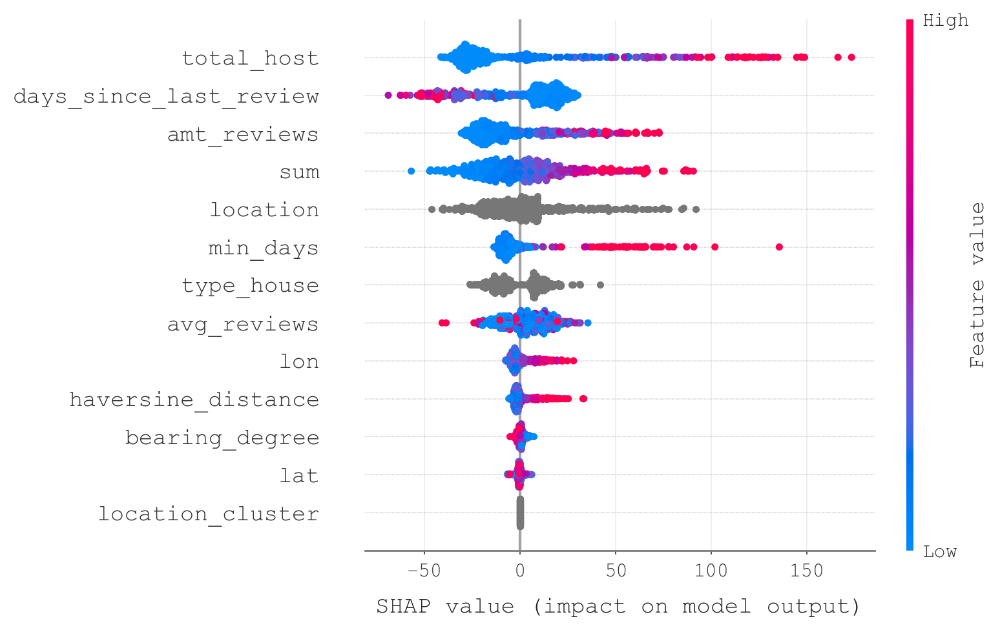

In [74]:
model = LGBMRegressor(verbosity=-1)
model = model.fit(X_train, y_train)

X_sample = X_train.sample(500, random_state=42)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample, max_display=20, 
                  plot_size=(8, 5))

plt.show()

- Значения SHAP слева от нуля соответствуют отрицательному вкладу признака в предсказание таргета, справа – положительному.
- Наибольшее влияние оказывают total_host, sum и amt_reviews, рост этих признаков увеличивает предсказание модели.
- Увеличение days_since_last_review снижает предсказание.
- sum (стоимость аренды за период) разделяет дешевые и дорогие объекты.
- географические признаки имеют меньшее влияние, location_cluster не влияет на результат модели.

---

## Dataset for models

In [75]:
features, cat_features

(['location_cluster',
  'location',
  'lat',
  'lon',
  'type_house',
  'sum',
  'min_days',
  'amt_reviews',
  'avg_reviews',
  'total_host',
  'days_since_last_review',
  'bearing_degree',
  'haversine_distance'],
 ['location_cluster', 'location', 'type_house'])

In [76]:
X_full = X_full[features].copy()
X_test = X_test[features].copy()

assert X_full.shape[0] == y_full.shape[0]

# Utils

In [77]:
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from category_encoders.cat_boost import CatBoostEncoder
from tqdm import tqdm

In [78]:
from catboost import CatBoostRegressor


def run_model(model_class, params, X, y, X_test, cat_features, target_bin, n_splits=5):
    """
    Обучает модель с использованием Stratified KFold и возвращает предсказания.

    Parameters:
        model_class: класс модели 
        params: словарь гиперпараметров модели
        X: признаки train
        y: таргет train
        X_test: признаки test
        cat_features: список категориальных признаков для encoder
        target_bin: массив/серия для стратификации
        n_splits: количество фолдов

    Returns:
        oof_preds: out-of-fold предсказания для train
        test_preds: усредненные предсказания для test
    """


    # === контейнеры ===============================

    # OOF предсказания для train: пустой контейнер
    oof_preds = np.zeros(len(X))
    
    # предсказания для test по фолдам
    test_preds_folds = []    

    # ~~~ для epistemic uncertanity~~~
    train_preds_folds = []


    # === StratifiedKFold кросс-валидация ===========

    # инициализация стратифицированной KFold кросс-валидации
    # n_splits=5 - в валидацию уйдет 20% данных
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)


    # для каждого фолда ... разделить X на train\valid с сохранением распределения target (через target_bin)
    for fold, (train_rows, valid_rows) in enumerate(skf.split(X, target_bin)):
        
        # разделение данных из X на train и valid
        X_train = X.iloc[train_rows]
        X_valid = X.iloc[valid_rows]

        y_train = y.iloc[train_rows]
        y_valid = y.iloc[valid_rows]

      
        # === обучение моделей =============================

        # модель: инициализация / гиперпараметры    
        model = model_class(**params)


        # --- отдельный пайплайн для CatBoostRegressor ----
        
        # для CatBoost не нужно кодировать категории, 
        # так как он умеет работать с ними напрямую
        if issubclass(model_class, CatBoostRegressor):
            X_train_encoded = X_train.copy()
            X_valid_encoded = X_valid.copy()
            X_test_encoded = X_test.copy()

            # ~~~ для epistemic uncertanity~~~
            X_full_encoded = X.copy()

            # обучение
            model.fit(X_train_encoded, y_train, 
                      eval_set=(X_valid_encoded, y_valid), 
                      cat_features=cat_features,
                      verbose=False, early_stopping_rounds=50)

        # --- отдельный пайплайн для LGBMRegressor ----
        elif issubclass(model_class, LGBMRegressor):
            X_train_encoded = X_train.copy()
            X_valid_encoded = X_valid.copy()
            X_test_encoded = X_test.copy()

            # ~~~ для epistemic uncertanity~~~
            X_full_encoded = X.copy()

            for col in cat_features:
                X_train_encoded[col] = X_train_encoded[col].astype('category')
                X_valid_encoded[col] = X_valid_encoded[col].astype('category')
                X_test_encoded[col] = X_test_encoded[col].astype('category')
                X_full_encoded[col] = X_full_encoded[col].astype('category')

            # обучение
            model.fit(
                X_train_encoded, y_train,
                eval_set=[(X_valid_encoded, y_valid)])


        # --- для остальных моделей ----------------------
        else:
            encoder = CatBoostEncoder(cols=cat_features)

            # fit_transform заменяет категорию на число с учетом ее среднего таргета
            X_train_encoded = encoder.fit_transform(X_train, y_train)

            # transform преобразует категорию по уже обученному энкодеру    
            X_valid_encoded = encoder.transform(X_valid)
            X_test_encoded = encoder.transform(X_test)

            # ~~~ для epistemic uncertanity ~~~ transform всего X тем же энкодером
            X_full_encoded = encoder.transform(X)

            # модель: обучение на train
            model.fit(X_train_encoded, y_train)

        
        # === получение предсказаний =============================

        # предсказания для valid и test обученной моделью
        preds_valid_fold = model.predict(X_valid_encoded)
        preds_test_fold = model.predict(X_test_encoded)
        preds_full_fold = model.predict(X_full_encoded)

        # предсказания не могут быть больше 365 дней
        preds_valid_fold = np.clip(model.predict(X_valid_encoded), 0, 365)
        preds_test_fold = np.clip(model.predict(X_test_encoded), 0, 365)
        preds_full_fold = np.clip(model.predict(X_full_encoded), 0, 365)

        # "честные" пресказания для обучения мета-модели
        # заполняем вектор OOF предсказаниями для текущего valid фолда
        oof_preds[valid_rows] = preds_valid_fold

        # сохраняем предсказания по фолдам
        test_preds_folds.append(preds_test_fold)        

        # ~~~ для epistemic uncertanity ~~~
        train_preds_folds.append(preds_full_fold)
        

    # === агрегация ==============================================

    # усреднение теста
    test_preds = np.mean(test_preds_folds, axis=0)    

    # ~~~ epistemic uncertanity ~~~
    train_preds_folds = np.array(train_preds_folds)  
    epistemic_uncertainty = train_preds_folds.std(axis=0)


    return oof_preds, test_preds, epistemic_uncertainty, train_preds_folds

# **Models**

## Model fit (1) – Baseline training

In [79]:
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from sklearn.metrics import mean_squared_error

In [80]:
# Проверка данных перед обучением
print(f"y shape: {y_full.shape[0]}\n")

print(f"X shape {X_full[features].shape}, features: \n{X_full[features].columns.to_numpy()}\n")
print(f"X_test shape {X_test[features].shape}, features: \n{X_test[features].columns.to_numpy()}\n")

print(f"cat_features: {cat_features}\n")

assert X_full[features].shape[0] == y_full.shape[0]
assert X_full[features].shape[1] == X_test[features].shape[1]

y shape: 36671

X shape (36671, 13), features: 
['location_cluster' 'location' 'lat' 'lon' 'type_house' 'sum' 'min_days'
 'amt_reviews' 'avg_reviews' 'total_host' 'days_since_last_review'
 'bearing_degree' 'haversine_distance']

X_test shape (12224, 13), features: 
['location_cluster' 'location' 'lat' 'lon' 'type_house' 'sum' 'min_days'
 'amt_reviews' 'avg_reviews' 'total_host' 'days_since_last_review'
 'bearing_degree' 'haversine_distance']

cat_features: ['location_cluster', 'location', 'type_house']



In [81]:
# для сохранения MSE базовых моделей    
baseline_scores = {}

# общие данные для моделей
model_data = {
    'y': y_full,
    'target_bin': target_bin
}

In [ ]:
# 1. RandomForestRegressor

# признаки на удаление
rf_features = [f for f in X_full.columns if f not in [
    'location', 
    'type_house', 
    'location_cluster'
    ]]
rf_params = {'random_state': 1}

# данные для модели
model_data['X'] = X_full[rf_features]
model_data['X_test'] = X_test[rf_features]
model_data['cat_features'] = [f for f in cat_features if f in rf_features]

oof_rf, test_rf, eu_rf, preds_folds_rf = run_model(RandomForestRegressor, rf_params, **model_data)

baseline_scores['rf'] = mean_squared_error(y_full, oof_rf)
print(f"Random Forest MSE: {baseline_scores['rf']:.2f}")

# Random Forest MSE: 10529.18 

Random Forest MSE: 10418.45


In [ ]:
# 2. XGBRegressor

xgb_features = [f for f in X_full.columns if f not in [
    'location', 
    'type_house', 
    'location_cluster',
    # 'lat',
    # 'bearing_degree'
    ]]
xgb_params = {'random_state': 1, 'n_estimators': 100}

model_data['X'] = X_full[xgb_features]
model_data['X_test'] = X_test[xgb_features]
model_data['cat_features'] = [f for f in cat_features if f in xgb_features]

oof_xgb, test_xgb, eu_xgb, preds_folds_xgb = run_model(XGBRegressor, xgb_params, **model_data)

baseline_scores['xgb'] = mean_squared_error(y_full, oof_xgb)
print(f"XGBoost MSE: {baseline_scores['xgb']:.2f}")

# XGBoost MSE: 10691.98

In [ ]:
# 3. LGBMRegressor

lgbm_features = [f for f in X_full.columns if f not in [
    'location', 
    'type_house', 
    'location_cluster'
    ]]
lgbm_params = {'random_state': 1, 'n_estimators': 100, 'verbosity':0}

model_data['X'] = X_full[lgbm_features]
model_data['X_test'] = X_test[lgbm_features]
model_data['cat_features'] = [f for f in cat_features if f in lgbm_features]

oof_lgbm, test_lgbm, eu_lgbm, preds_folds_lgbm = run_model(LGBMRegressor, lgbm_params, **model_data)

baseline_scores['lgbm'] = mean_squared_error(y_full, oof_lgbm)
print(f"LightGBM MSE: {baseline_scores['lgbm']:.2f}")

# LightGBM MSE: 10564.32

In [ ]:
# 4. CatBoostRegressor

cb_features = [f for f in X_full.columns if f not in [
    # 'location', 
    # 'type_house', 
    # 'location_cluster'
    ]]
cb_params = {'random_state': 1, 'iterations': 100, 'verbose': 0}

model_data['X'] = X_full[cb_features]
model_data['X_test'] = X_test[cb_features]
model_data['cat_features'] = [f for f in cat_features if f in cb_features]

oof_cb, test_cb, eu_cb, preds_folds_cb = run_model(CatBoostRegressor, cb_params, **model_data)

baseline_scores['cb'] = mean_squared_error(y_full, oof_cb)
print(f"CatBoost MSE: {baseline_scores['cb']:.2f}")

# CatBoost MSE: 10620.72 - все убрать
# CatBoost MSE: 10619.29 - оставить 'location'
# CatBoost MSE: 10408.43 - оставить 'location', 'type_house'
# CatBoost MSE: 10376.02 - ничего не убирать

In [ ]:
# 5. LinearRegression
lr_features = [f for f in X_full.columns if f not in [
    # 'location', 
    # 'type_house', 
    # 'location_cluster'
    ]]
lr_params = {}

model_data['X'] = X_full[lr_features]
model_data['X_test'] = X_test[lr_features]
model_data['cat_features'] = [f for f in cat_features if f in lr_features]

oof_lr, test_lr, eu_lr, preds_folds_lr = run_model(LinearRegression, lr_params, **model_data)

baseline_scores['lr'] = mean_squared_error(y_full, oof_lr)
print(f"LinearRegression MSE: {baseline_scores['lr']:.2f}")

# LinearRegression MSE: 13822.91

In [87]:
(pd.DataFrame(baseline_scores, index=['MSE']).T.sort_values('MSE'))

,MSE
rf,10418.453827


## Hyperparameters tuning
- hyper opt - подобрать гиперпараметры модели на optuna - несколько - небольшая сетка. 

Скорость / качество:
- n_estimators: количество деревьев в ансамбле. Больше – лучше обучение, но риск переобучения, меньше – недообучение (обычно: 300–1000)
- learning_rate: контролирует вес нового дерева при добавлении его в ансамбль (меньше lr – больше n_estimators)

Контроль сложности:
- max_depth: ограничивает глубину каждого дерева, предотвращая переобучение.
- num_leaves: максимальное количество листьев в дереве. Чем больше значение, тем сложнее модель и тем выше риск переобучения
- min_samples_leaf / min_child_samples: минимальное количество объектов, которые должны находиться в каждом листе дерева

Борьба с переобучением:
- subsample: доля объектов, используемых при построении каждого дерева. Значения < 1 добавляют случайность и снижают переобучение.
- colsample_bytree: доля признаков, используемых при построении дерева. Снижает корреляцию между деревьями и улучшает обобщающую способность модели.
- reg_alpha (L1): штраф за веса, зануляет слабые признаки, делает модель проще
- reg_lambda (L2): сглаживает веса, снижает variance

In [88]:
import optuna
optuna.logging.set_verbosity(optuna.logging.ERROR)
import xgboost as xgb

xgb.set_config(verbosity=0)

In [89]:
def objective(trial, model_class, features, cat_features, param_fn):

    params = param_fn(trial)

    oof, _, _, _ = run_model(
        model_class,
        params,
        X=X_full[features],
        y=y_full,
        X_test=X_test[features],
        cat_features=[f for f in cat_features if f in features],
        target_bin=target_bin,
        n_splits=3
    )

    return mean_squared_error(y_full, oof)

In [ ]:
def lgbm_params(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),
        'learning_rate': trial.suggest_float('learning_rate', 0.02, 0.05),
        'num_leaves': trial.suggest_int('num_leaves', 50, 100),
        'min_child_samples': trial.suggest_int('min_child_samples', 15, 30),
        'random_state': 42,
        'verbosity': -1
    }

study_lgbm = optuna.create_study(direction='minimize')

study_lgbm.optimize(
    lambda trial: objective(
        trial,
        model_class=LGBMRegressor,
        features=lgbm_features,
        cat_features=cat_features,
        param_fn=lgbm_params
    ),
    n_trials=20,
    show_progress_bar=True
)

print(f"Best LGBM params:")
print(study_lgbm.best_params)

print("\nBest MSE:")
print(study_lgbm.best_value)

In [91]:
# гиперпараметры подобраны по одному из испытаний с лучшим MSE
lgbm_best_params = {
    'n_estimators': 600, 
    'learning_rate': 0.02, 
    'num_leaves': 130, 
    'max_depth': 10, 
    'min_child_samples': 20, 
    'subsample': 0.8, 
    'colsample_bytree': 0.7, 
    'reg_alpha': 1.0, 
    'reg_lambda': 1.5
    }

# Best MSE: 10351.515170135286

In [ ]:
def xgb_params(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),
        'learning_rate': trial.suggest_float('learning_rate', 0.02, 0.05),
        'max_depth': trial.suggest_int('max_depth', 4, 6),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 3),
        'subsample': trial.suggest_float('subsample', 0.7, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.9),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.8, 1.5),
        'random_state': 42,
        'verbosity': 0,
    }

study_xgb = optuna.create_study(direction='minimize')

study_xgb.optimize(
    lambda trial: objective(
        trial,
        model_class=XGBRegressor,
        features=xgb_features,
        cat_features=cat_features,
        param_fn=xgb_params
    ),
    n_trials=30,
    show_progress_bar=True
)

print("Best XGB params:")
print(study_xgb.best_params)

print("\nBest MSE:")
print(study_xgb.best_value)

In [93]:
# гиперпараметры подобраны по одному из испытаний с лучшим MSE
xgb_best_params = {
    'n_estimators': 700, 
    'learning_rate': 0.02, 
    'max_depth': 8, 
    'min_child_weight': 4, 
    'subsample': 0.9, 
    'colsample_bytree': 0.9, 
    'gamma': 1.5, 
    'reg_alpha': 2.0, 
    'reg_lambda': 1.0
    }

# Best MSE: 10291.378902221952

In [ ]:
def cb_params(trial):
    return {
        'iterations': trial.suggest_int('iterations', 400, 600),
        'learning_rate': trial.suggest_float('learning_rate', 0.02, 0.05),
        'depth': trial.suggest_int('depth', 4, 6),
        'random_state': 42,
        'verbose': 0
    }

study_cb = optuna.create_study(direction='minimize')

study_cb.optimize(
    lambda trial: objective(
        trial,
        model_class=CatBoostRegressor,
        features=cb_features,
        cat_features=cat_features,
        param_fn=cb_params
    ),
    n_trials=30,
    show_progress_bar=True
)

print("Best CB params:")
print(study_cb.best_params)

print("\nBest MSE:")
print(study_cb.best_value)

In [95]:
# гиперпараметры подобраны по одному из испытаний с лучшим MSE
cb_best_params = {
    'iterations': 800, 
    'learning_rate': 0.06, 
    'depth': 8, 
    'l2_leaf_reg': 2.0, 
    'bagging_temperature': 0.4, 
    'random_strength': 0.5, 
    'border_count': 96
    }

# Best MSE: 10170.92293496973

## Model fit (2) – Final model training
Финальное обучение модели после подбора гиперпараметров

In [96]:
# 2. XGBRegressor

xgb_features = [f for f in X_full.columns if f not in [
    'location', 
    'type_house', 
    'location_cluster'
    ]]

# xgb_params = {**study_xgb.best_params, 'verbosity':0}
xgb_params = {**xgb_best_params, 'verbosity':0}

model_data['X'] = X_full[xgb_features]
model_data['X_test'] = X_test[xgb_features]
model_data['cat_features'] = [f for f in cat_features if f in xgb_features]

oof_xgb, test_xgb, eu_xgb, preds_folds_xgb = run_model(XGBRegressor, xgb_params, **model_data)

baseline_scores['xgb'] = mean_squared_error(y_full, oof_xgb)
print(f"XGBoost MSE: {baseline_scores['xgb']:.2f}")

# XGBoost MSE: 10711.72 - before tuning
# XGBoost MSE: 10234.73 - after tining

XGBoost MSE: 10208.33


In [97]:
# 3. LGBMRegressor

lgbm_features = [f for f in X_full.columns if f not in ['location', 'type_house', 'location_cluster']]

# lgbm_params = {**study_lgbm.best_params, 'verbosity':-1}
lgbm_params = {**lgbm_best_params, 'verbosity':-1}

model_data['X'] = X_full[lgbm_features]
model_data['X_test'] = X_test[lgbm_features]
model_data['cat_features'] = [f for f in cat_features if f in lgbm_features]

oof_lgbm, test_lgbm, eu_lgbm, preds_folds_lgbm = run_model(LGBMRegressor, lgbm_params, **model_data)

baseline_scores['lgbm'] = mean_squared_error(y_full, oof_lgbm)
print(f"LightGBM MSE: {baseline_scores['lgbm']:.2f}")

# LightGBM MSE: 10564.62 - before tuning
# LightGBM MSE: 10308.07 - after tuning

LightGBM MSE: 10270.71


In [100]:
# 4. CatBoostRegressor

cb_features = [f for f in X_full.columns if f not in [
    # 'location', 
    # 'type_house', 
    # 'location_cluster'
    ]]

# cb_params = {**study_cb.best_params, 'verbose': 0}
cb_params = {**cb_best_params, 'verbose': 0}

model_data['X'] = X_full[cb_features]
model_data['X_test'] = X_test[cb_features]
model_data['cat_features'] = [f for f in cat_features if f in cb_features]

oof_cb, test_cb, eu_cb, preds_folds_cb = run_model(CatBoostRegressor, cb_params, **model_data)

baseline_scores['cb'] = mean_squared_error(y_full, oof_cb)
print(f"CatBoost MSE: {baseline_scores['cb']:.2f}")

# CatBoost MSE: 10387.30 - before tuning
# CatBoost MSE: 10126.61 - after tuning

CatBoost MSE: 10104.94


# Ensemble / Stacking

In [101]:
# стекинг
oof_matrix = pd.DataFrame({
    # "lr": oof_lr,
    "rf": oof_rf,
    "lgbm": oof_lgbm,
    "cb": oof_cb,
    "xgb": oof_xgb
})

test_matrix = pd.DataFrame({
    # "lr": test_lr,
    "rf": test_rf,
    "lgbm": test_lgbm,
    "cb": test_cb,
    "xgb": test_xgb
})

### CatBoost meta-model

In [102]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# контейнеры
oof_meta = np.zeros(len(oof_matrix))
test_preds_folds = []

# обучение на cv kfold
for train_idx, valid_idx in kf.split(oof_matrix):

    X_tr, X_val = oof_matrix.iloc[train_idx], oof_matrix.iloc[valid_idx]
    y_tr, y_val = y_full.iloc[train_idx], y_full.iloc[valid_idx]

    model = CatBoostRegressor(
        depth=4,
        learning_rate=0.03,
        iterations=400,
        l2_leaf_reg=5,
        verbose=0
    )

    # обучение модели
    model.fit(X_tr, y_tr)

    # OOF предсказания
    oof_meta[valid_idx] = model.predict(X_val)

    # тест предсказания по фолдам
    test_preds_folds.append(model.predict(test_matrix))

# финальные предсказания
test_meta_preds = np.mean(test_preds_folds, axis=0)

# метрика
mse_stack = mean_squared_error(y_full, oof_meta)

print(f"Stacking MSE (CatBoost meta): {mse_stack:.4f}")

Stacking MSE (CatBoost meta): 9907.1711


In [103]:
# Stacking MSE (CatBoost meta): 9958.2483

In [104]:
# # submission save to file
# submission = pd.read_csv('data/sample_submition.csv')

# submission['prediction'] = test_meta_preds
# submission.to_csv('submission_cb_meta(1).csv', index=False)

# assert submission.shape[0] == len(test_xgb)

---

# Uncertainty

### Эпистемическая неопределенность

Эпистемическая неопределенность отражает степень неопределенности модели, связанную с недостатком информации о данных. В данном случае это мера согласия моделей ансамбля в их предсказаниях. Она рассчитывается как стандартное отклонение предсказаний базовых моделей, чем сильнее отличаются их предсказания, тем выше эпистемическая неопределенность. 

Эпистемическую неопределенность можно уменьшить, если добавить больше обучающих примеров в ту область, где модель не уверена.

$\text{epistemic = std(predictions)}$

In [106]:
# предсказания базовых моделей
preds_matrix = np.vstack([
    # oof_lr,
    oof_rf,
    oof_lgbm,
    oof_cb,
    oof_xgb
]).T

# эпистемическая неопределенность: std от предсказаний по моделям
epistemic_uncertainty = preds_matrix.std(axis=1)

In [107]:
df_uncertainty = pd.DataFrame({
    'y_true': y_full,
    # 'lr': oof_lr,
    'rf': oof_rf,
    'lgbm': oof_lgbm,
    'cb': oof_cb,
    'xgb': oof_xgb,
    'meta': oof_meta,
    'uncertainty': epistemic_uncertainty
})

# абсолютная ошибка: (истинный таргет - предсказание мета-модели)
df_uncertainty['error'] = np.abs(df_uncertainty['y_true'] - oof_meta)

display(df_uncertainty.describe())

# объекты с самой высокой EU
print("Объекты с самой высокой эпистемической неопределенностью")
display(df_uncertainty.sort_values('uncertainty', ascending=False).round(2).head(5))

# объекты с самой низкой EU
print("Объекты с самой низкой эпистемической неопределенностью")
display(df_uncertainty.sort_values('uncertainty').round(2).head(5))

print("Предсказания с максимальной ошибкой")
display(df_uncertainty.sort_values('error', ascending=False).round(2).head(5))

print("Предсказания с минимальной ошибкой")
display(df_uncertainty.sort_values('error').round(2).head(5))

,y_true,rf,lgbm,cb,xgb,meta,uncertainty,error
count,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000
mean,112.766628,115.154243,112.795505,113.047849,112.868228,112.782454,12.638850,74.117459
std,131.583284,85.346884,83.639983,84.279462,84.904519,86.046505,8.225833,66.437142
min,0.000000,0.000000,0.000000,0.000000,0.000000,3.113310,0.000000,0.001039
25%,0.000000,40.380000,39.486149,39.914492,38.430384,36.935092,6.645692,22.006275
50%,45.000000,104.900000,101.293692,102.636466,99.345482,99.572788,10.999310,54.401561
75%,227.000000,173.250000,169.915097,170.228221,170.927345,168.393000,16.730663,108.461478
max,365.000000,363.200000,365.000000,365.000000,365.000000,346.005650,72.984495,361.754302


Объекты с самой высокой эпистемической неопределенностью


,y_true,rf,lgbm,cb,xgb,meta,uncertainty,error
1870,306,37.20,157.60,242.61,144.57,88.20,72.98,217.80
21289,0,177.04,19.45,0.00,29.67,18.30,70.38,18.30
8603,0,37.83,145.42,235.55,143.80,108.65,70.02,108.65
5665,5,255.90,109.28,83.79,139.12,108.74,65.84,103.74
7739,24,85.00,214.82,262.54,179.30,140.11,65.06,116.11


Объекты с самой низкой эпистемической неопределенностью


,y_true,rf,lgbm,cb,xgb,meta,uncertainty,error
27392,0,0.0,0.0,0.0,0.0,3.20,0.0,3.20
21414,0,0.0,0.0,0.0,0.0,3.25,0.0,3.25
7525,53,0.0,0.0,0.0,0.0,3.73,0.0,49.27
11051,0,0.0,0.0,0.0,0.0,3.20,0.0,3.20
6024,0,0.0,0.0,0.0,0.0,3.73,0.0,3.73


Предсказания с максимальной ошибкой


,y_true,rf,lgbm,cb,xgb,meta,uncertainty,error
1832,365,0.00,0.00,0.00,0.00,3.25,0.00,361.75
11798,365,3.47,2.33,0.00,0.00,3.30,1.50,361.70
9342,365,5.50,0.00,5.22,0.00,4.69,2.68,360.31
29803,363,1.66,0.00,0.00,0.00,3.15,0.72,359.85
26438,364,8.04,16.49,9.45,6.45,8.93,3.84,355.07


Предсказания с минимальной ошибкой


,y_true,rf,lgbm,cb,xgb,meta,uncertainty,error
31681,164,157.08,136.95,171.22,157.17,164.00,12.21,0.00
10351,263,249.49,277.80,224.19,247.61,263.00,19.01,0.00
31867,182,159.75,186.51,223.38,171.60,182.01,23.94,0.01
21753,19,24.91,32.95,22.38,25.29,18.99,3.95,0.01
35959,16,47.83,11.51,18.12,19.58,15.98,13.95,0.02


Для объектов **с самой высокой эпистемической неопределенностью** линейная регрессия часто дает сильно выбивающиеся предсказания. Модели не согласны между собой > высокая вариативность предсказаний > высокая эпистемическая неопределенность. В этом датасете высокую неопределенность дали объекты как с высоким, так и средним и низким значением таргета. Пример:
- объект 10319, таргет 365, предсказания моделей: [1110.03, 184.06, 219.02, 153.71, 169.65], финальное предсказание 175.52,\
высокая неопределенность – 372.00, и высокая ошибка - 189.48

Для объектов **с минимальной эпистемической неопределенностью** модели дают почти одинаковые предсказания (разброс значений 1-2). Модели согласны между собой > вариативность низкая > низкая эпистемическая неопределенность. Но при этом модели могут согласованно ошибаться. В этом датасете в эту категорию попали в основном объекты с нулевым или небольшим таргетом. Пример:
- объект 26664, таргет 54, предсказания моделей: [135.18, 134.31, 135.69, 133.95, 134.49], финальное предсказание 137.20,\
неопределенность низкая – 0.63, ошибка высокая - 83.20
Низкая эпистемическая неопределенность при высокой фактической ошибке говорит о высокой алеаторной неопределенности – модели уверены в предсказаниях, но данные содержат шум или структуру, которые модели не уловили. 

Есть нетипичные объекты **с высокой ошибкой, но низкой эпистемической неопределенностью** – все модели дают похожие предсказания и одинаково ошибаются в одну сторону, как правило сильно занижая таргет. В основном в этом датасете это объекты с таргетом близким к максимальному (365), который модели согласованно предсказали на уровне 5-40. Пример:
- объект 1832, таргет 365, предсказания моделей [4.08 ... -9.69], финальное 3.70, неопределенность всего 5.35, но ошибка максимальна – 361.30
Модели уверенно дают неправильный прогноз, что является признаком алеаторной неопределенности.

Для объектов **с минимальной ошибкой** мета-модель (стекинг) способна давать точные предсказания даже при заметном разбросе между базовыми моделями.

\
**Вывод**\
Эпистемическая неопределенность отражает степень согласованности моделей и в большинстве случаев коррелирует с ошибкой предсказания: чем выше разброс предсказаний, тем выше риск ошибки. Но она не является полной мерой неопределенности – есть случаи, когда модели показывают низкую эпистемическую неопределенность, но при этом дают большую ошибку. Это связано с алеаторной неопределенностью, обусловленной шумом и сложностью данных.

В то же время есть случаи, когда стекинг моделей при высокой неопределенности все же способен дать довольно точный результат.

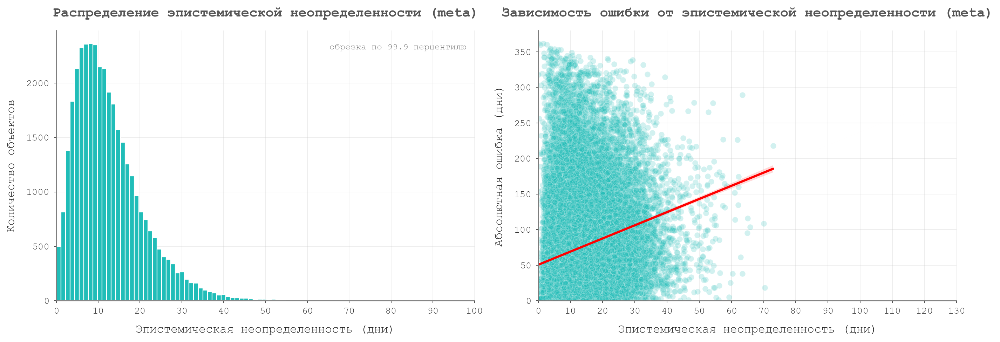

In [108]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# histplot: распределение эпистемической неопределенности 
axes[0].hist(epistemic_uncertainty, bins=50, edgecolor='white',
             range=(0, np.quantile(epistemic_uncertainty, 0.999)))

axes[0].set_xlim(left=0)
axes[0].set_xticks(np.arange(0, 101, 10))
axes[0].grid(which='major', axis='x', alpha=0.3)

axes[0].set_xlabel("Эпистемическая неопределенность (дни)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_title("Распределение эпистемической неопределенности (meta)")

axes[0].text(0.98, 0.95,
    "обрезка по 99.9 перцентилю",
    transform=axes[0].transAxes,
    ha='right', va='top',
    fontsize=9,
    color="#777777"
)

# scatterplot: зависимость неопределенности и ошибки 
sns.scatterplot(
    x=epistemic_uncertainty,
    y=np.abs(y_full - oof_meta),
    ax=axes[1],
    alpha=0.2
)

# regplot
sns.regplot(
    x=epistemic_uncertainty,
    y=np.abs(y_full - oof_meta),
    scatter=False, color='red', ax=axes[1])

axes[1].set_xlabel("Эпистемическая неопределенность (дни)")
axes[1].set_ylabel("Абсолютная ошибка (дни)")
axes[1].set_title("Зависимость ошибки от эпистемической неопределенности (meta)")

axes[1].set_xlim(left=0)
axes[1].set_ylim(bottom=0)
axes[1].set_xticks(np.arange(0, 131, 10))
axes[1].grid(which='major', axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

1. **histplot**: основная часть значений эпистемической неопределенности сосредоточена в диапазоне ~10–50, при этом есть длинный правый хвост до 300+. Большинство объектов понятны моделям, но есть редкие сложные случаи

2. **scatterplot**: линия тренда почти горизонтальная, нет линейной зависимости между эпистемической неопределенностью и ошибкой. Модели могут сильно расходиться в предсказаниях, но это не всегда приводит к ошибке, а могут совпадать в предсказаниях и ошибаться.

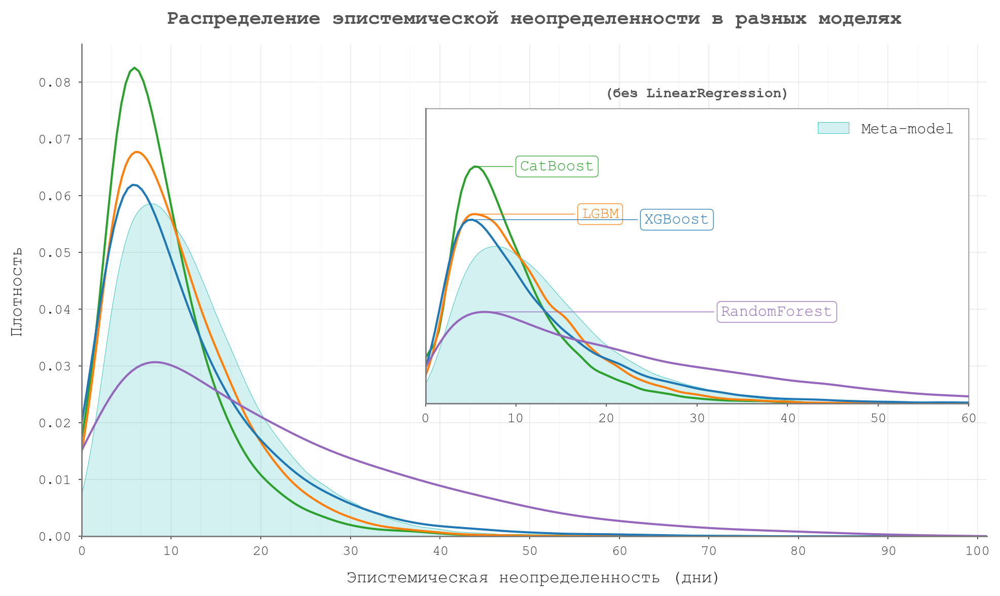

In [109]:
from scipy.stats import gaussian_kde

# функция для нахождения пика KDE
def get_peak(data):
    kde = gaussian_kde(data)
    x = np.linspace(min(data), max(data), 200)
    y = kde(x)
    return x[np.argmax(y)], np.max(y)

# цвета
colors = plt.get_cmap('tab10').colors

# все модели
models = {
    # 'LinearRegression': (eu_lr, colors[3]),
    'CatBoost': (eu_cb, colors[2]),
    'LGBM': (eu_lgbm, colors[1]),
    'XGBoost': (eu_xgb, colors[0]),
    'RandomForest': (eu_rf, colors[4]),
}

# модели для inset
inset_keys = ['CatBoost', 'LGBM', 'XGBoost', 'RandomForest']

# ==========================
plt.figure(figsize=(10, 6))
ax = plt.gca()

# основной график
for name, (data, color) in models.items():
    sns.kdeplot(data, bw_adjust=2, color=color, cut=0, ax=ax)

# meta-model
sns.kdeplot(epistemic_uncertainty, color=box, cut=0, 
    fill=True, alpha=0.2, linewidth=0.3, ax=ax)

# оформление
ax.set_title("Распределение эпистемической неопределенности в разных моделях")
ax.set_xlabel("Эпистемическая неопределенность (дни)")
ax.set_ylabel("Плотность")

ax.set_xlim(0, 101)
ax.set_xticks(np.arange(0, 101, 10))      
ax.set_xticks(np.arange(0, 101, 3.3333), minor=True)  

ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)

# === INSET ================
axins = ax.inset_axes([0.38, 0.27, 0.6, 0.6])

shift=5

for name in inset_keys:
    data, color = models[name]
    
    # линия kde
    sns.kdeplot(data, color=color, cut=0, ax=axins)

    # пик kde
    x_peak, y_peak = get_peak(data)

    # аннотация
    axins.annotate(name,
    xy=(x_peak, y_peak),
    xytext=(x_peak+shift, y_peak ), 
    color=color, fontsize=11, va='center',
    arrowprops=dict(arrowstyle='-', color=color, lw=0.5, ),
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor=color, lw=0.5, alpha=0.9),
    )
    shift+=7

# meta-model в inset
sns.kdeplot(epistemic_uncertainty, color=box, label='Meta-model',
    fill=True, cut=0, alpha=0.2, linewidth=0.3, ax=axins)

axins.legend(loc='upper right')

# аннотация
ax.annotate('LinearRegression',
xy=(2, 0.2),
xytext=(8, 0.2), 
zorder=10,
color=colors[3], fontsize=11, va='center', ha='left',
arrowprops=dict(arrowstyle='-', color=colors[3], lw=0.5, ),
bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor=colors[3], lw=0.5, alpha=0.9),
)

# оформление inset
axins.set_title("(без LinearRegression)", fontsize=10, loc='center', pad=8)
axins.set_xlim(0, 60)
axins.set_ylim(0, 0.11)
axins.set_yticks([])
axins.set_ylabel('')
axins.grid(False)

axins.patch.set_facecolor('white')
axins.patch.set_alpha(1)
axins.patch.set_edgecolor("#777777")
axins.patch.set_linewidth(0.5)

plt.tight_layout()
plt.show()

**Сравнение эпистемической неопределенности в разных моделях**

Линейная регрессия имеет очень узкое распределение с пиком около нуля. Модель практически не выражает неопределенность и даёт стабильно одинаковые предсказания.

У бустинговых моделей (CatBoost, LGBM, XGBoost) распределения шире, их пики находятся примерно в диапазоне 5–15. Модели в целом уверены, но при этом допускают вариативность в предсказаниях. Среди них CatBoost выглядит наиболее «стабильным» — его распределение более сконцентрировано.

Random Forest показывает ещё более широкое распределение с выраженным правым хвостом, он чаще сталкивается не уверен в предсказаниях для сложных объектов.

Мета-модель (стекинг) смещена вправо относительно базовых моделей, с пиком примерно в области 15–25. При объединении моделей их предсказания начинают расходиться, общий разброс увеличивается.

Вывод:\
Линейная регрессия практически не отражает неопределенность, бустинговые модели более адекватно оценивают неопределенность. Стекинг усиливает различия между базовыми моделями, что приводит к более высоким значениям неопределенности на части объектов.

---

### Алеаторная неопределенность

Алеаторная неопределенность отражает степень неопределенности, связанную с шумом и случайностью в данных. В отличие от эпистемической, она не зависит от согласия моделей и присутствует даже при их полном совпадении. В данном случае алеаторная неопределенность в том, что модели могут давать близкие предсказания, но при этом значительно ошибаться относительно истинного значения таргета. Она оценивается через величину ошибки предсказания как разность между предсказанным и фактическим значением.

Алеаторную неопределенность нельзя уменьшить за счет добавления новых данных, так как она обусловлена внутренним шумом и сложностью процесса генерации данных.

$\text{aleatoric} = |\text{y\_true} - \text{prediction}|$

In [110]:
residuals = np.abs(y_full - oof_meta)

df_residuals = pd.DataFrame({
    'y_true': y_full,
    'prediction': oof_meta,
    'residual': residuals
})

display(df_residuals.describe())

# объекты с самой высокой алеаторной
print("Объекты с самой высокой алеаторной неопределенностью (максимальная ошибка)")
display(df_residuals.sort_values('residual', ascending=False).round(2).head(5))

# объекты с самой высокой алеаторной
print("Объекты с самой низкой алеаторной неопределенностью (минимальная ошибка)")
display(df_residuals.sort_values('residual').round(2).head(5))


,y_true,prediction,residual
count,36671.000000,36671.000000,36671.000000
mean,112.766628,112.782454,74.117459
std,131.583284,86.046505,66.437142
min,0.000000,3.113310,0.001039
25%,0.000000,36.935092,22.006275
50%,45.000000,99.572788,54.401561
75%,227.000000,168.393000,108.461478
max,365.000000,346.005650,361.754302


Объекты с самой высокой алеаторной неопределенностью (максимальная ошибка)


,y_true,prediction,residual
1832,365,3.25,361.75
11798,365,3.30,361.70
9342,365,4.69,360.31
29803,363,3.15,359.85
26438,364,8.93,355.07


Объекты с самой низкой алеаторной неопределенностью (минимальная ошибка)


,y_true,prediction,residual
31681,164,164.00,0.00
10351,263,263.00,0.00
31867,182,182.01,0.01
21753,19,18.99,0.01
35959,16,15.98,0.02


In [111]:
mask_high = (df_train['target'] >= 350) & (df_train['target'] <= 365)
share_high = mask_high.mean()

mask_low = (df_train['target'] == 0) 
share_low = mask_low.mean()

print(f"Таргет > 350: {share_high:.2%}")
print(f"Таргет = 0:   {share_low:.2%}")

Таргет > 350: 7.00%
Таргет = 0:   35.86%


**Алеаторная ошибка** (resisuals) по ансамблю моделей в половине предсказаний ошибается на ~54 дня (по медиане). Распределение ошибок асимметричное (max = 361, 75% = 109), значит есть длинный хвост с очень большими ошибками.

mean(y_true) ~ mean(prediction), значит модель не смещена в среднем.

Ошибка увеличивается для высоких значений таргета из-за дисбаланса распределения таргета (~35.7% нулевых значений) и регрессионного сглаживания.

Низкая ошибка у разных значений, в основном средних – модель хорошо работает в основной массе типичных данных.

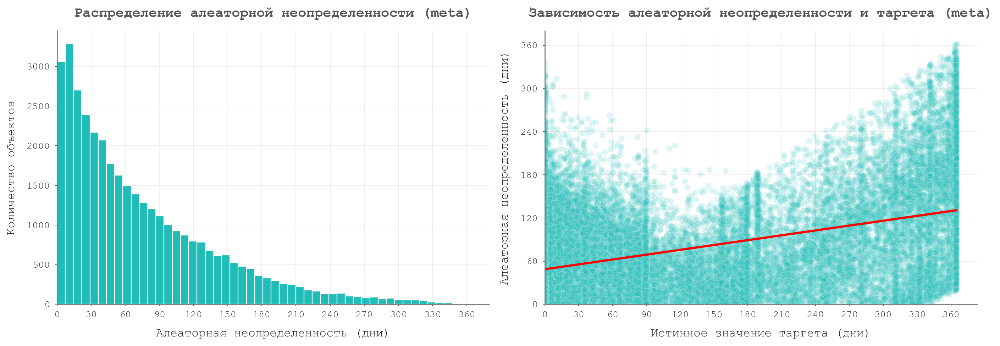

In [112]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# histplot: распределение алеаторной неопределенности 
axes[0].hist(residuals, bins=50, edgecolor='white')

axes[0].set_title("Распределение алеаторной неопределенности (meta)")
axes[0].set_xlabel("Алеаторная неопределенность (дни)")
axes[0].set_ylabel("Количество объектов")

axes[0].set_xticks(np.arange(0, 366, 30))
axes[0].set_xlim(xmin=0)


# scatterplot: зависимость ошибки и таргета 
sns.scatterplot(
    x=y_full,
    y=residuals,
    ax=axes[1],
    alpha=0.15
)

# regplot тренд
sns.regplot(
    x=y_full,
    y=residuals,
    scatter=False,
    ax=axes[1],
    color='red'
)

axes[1].set_xlabel("Истинное значение таргета (дни)")
axes[1].set_ylabel("Алеаторная неопределенность (дни)")
axes[1].set_title("Зависимость алеаторной неопределенности и таргета (meta)")

axes[1].set_xlim(left=0)
axes[1].set_ylim(bottom=0)
axes[1].set_xticks(np.arange(0, 366, 30))
axes[1].set_yticks(np.arange(0, 366, 60))


plt.tight_layout()
plt.show()

1. **histplot**: основная часть значений алеаторной неопределенности собрана в диапазоне ~0–100, при этом есть длинный правый хвост до 300+. Большинство объектов предсказываются с умеренной ошибкой, но есть редкие случаи с очень большой ошибкой.

2. **scatterplot**: наибольшая алеаторная неопределенность на больших значениях таргета, но и на малых тоже заметная. Лучше всего модели оценивают таргет в средних значениях. Результирующая линия тренда показывает что ошибка растёт вместе с таргетом. 

In [113]:
# алеаторные ошибки по моделям:
# ae_lr = np.abs(y_full - oof_lr)
ae_cb = np.abs(y_full - oof_cb)
ae_lgbm = np.abs(y_full - oof_lgbm)
ae_xgb = np.abs(y_full - oof_xgb)
ae_rf = np.abs(y_full - oof_rf)

ae_meta = np.abs(y_full - oof_meta)

In [ ]:
# np.max(ae_lr), np.max(ae_cb)

(365.0, 365.0)

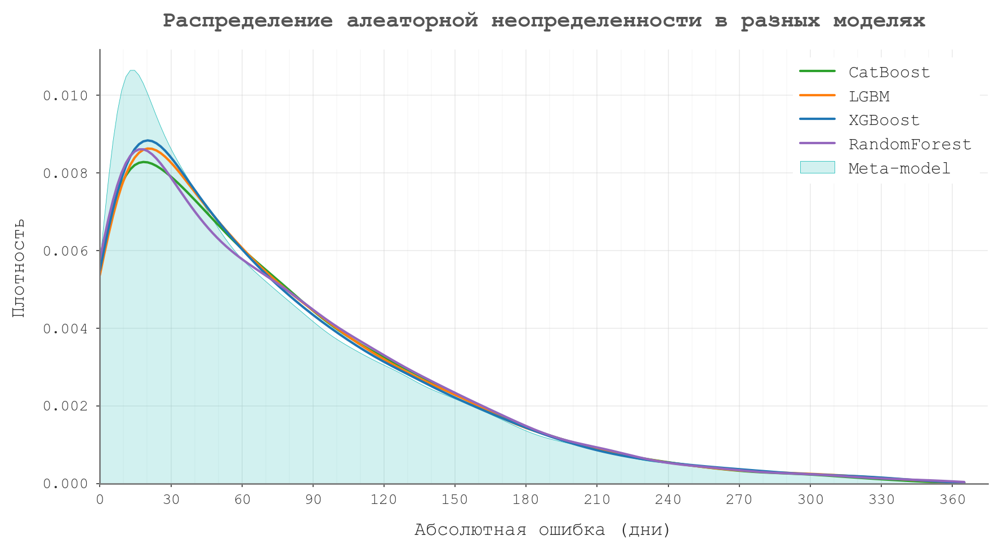

In [114]:
from scipy.stats import gaussian_kde

# цвета
colors = plt.get_cmap('tab10').colors

# все модели
models = {
    # 'LinearRegression': (ae_lr, colors[3]),
    'CatBoost': (ae_cb, colors[2]),
    'LGBM': (ae_lgbm, colors[1]),
    'XGBoost': (ae_xgb, colors[0]),
    'RandomForest': (ae_rf, colors[4]),
}

# ==========================
plt.figure(figsize=(9, 5))
ax = plt.gca()

# основной график
for name, (data, color) in models.items():
    sns.kdeplot(data, bw_adjust=1.5, color=color, cut=0, ax=ax, label=name)

# meta-model
sns.kdeplot(ae_meta, color=box, cut=0,
    fill=True, alpha=0.2, linewidth=0.3, ax=ax, label='Meta-model')

# оформление
ax.set_title("Распределение алеаторной неопределенности в разных моделях")
ax.set_xlabel("Абсолютная ошибка (дни)")
ax.set_ylabel("Плотность")
ax.set_xlim(0, 375)

ax.legend(loc='upper right', frameon=True, 
          facecolor='white', edgecolor='white', framealpha=1)

ax.set_xticks(np.arange(0, 366, 30))      
ax.set_xticks(np.arange(0, 366, 10), minor=True)  

ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)


plt.tight_layout()
plt.show()

**Распределения алеаторной неопределенности** у моделей в целом похожи, но есть различия.

Все ансамблевые модели (CatBoost, LGBM, XGBoost, Random Forest) показывают практически одинаковую форму распределения:
основная масса ошибок сосредоточена в диапазоне примерно 0–100, с длинным правым хвостом. Это говорит о том, что модели ведут себя схоже: на большинстве объектов ошибка средняя, но есть редкие сложные случаи с большими отклонениями.

Linear Regression заметно отличается – распределение смещено вправо, пик находится в области более высоких значений ошибки (примерно 80–100), хвост выражен сильнее. Модель систематически ошибается больше, чем остальные.

Meta-model (стекинг) в целом повторяет форму распределений бустинговых моделей, но слегка смещена влево: стекинг в среднем снижает ошибку и дает более устойчивые предсказания по сравнению с отдельными базовыми моделями.

Вывод:\
В отличие от эпистемической неопределенности, здесь модели ведут себя гораздо более похоже, основное различие в общием уровне ошибки.

- линейная регрессия — заметно хуже остальных
- бустинги и random forest — сопоставимы между собой
- стекинг — дает небольшое улучшение и сдвиг к меньшим ошибкам

#### Зависимость неопределенности от таргета

In [115]:
from scipy.interpolate import make_interp_spline

# функция для построения графика (error или uncertainty)
def plot_models(ax, metric):
    
    for name, (eu, ae, color) in models.items():

        # target — истинные значения
        # value — либо ошибка (aleatoric), либо uncertainty (epistemic)
        df = pd.DataFrame({
            'target': y_full,
            'value': ae if metric == 'aleatoric' else eu
        })

        # бины таргета по 15 дней
        df['bin'] = pd.cut(df['target'], bins=np.arange(0, 384, 15))

        # агрегация таргета по бинам
        df_g = (df.groupby('bin', observed=False).median().sort_values('target'))

        x = df_g['target'].values   # центр бина (примерный уровень таргета)
        y = df_g['value'].values    # средняя ошибка или uncertainty

        # ---- сглаживание линии ----

        # сортировка 
        idx = np.argsort(x)
        x, y = x[idx], y[idx]

        # сетка по оси X 
        x_new = np.linspace(x.min(), x.max(), 180)

        # степень сплайна:
        k = min(3, len(x) - 1)

        # сглаженная линия
        y_smooth = make_interp_spline(x, y, k=k)(x_new)

        # вывод
        ax.plot(x_new, y_smooth, color=color, alpha=0.9, lw=2, label=name) 
        # ax.scatter(x, y, color=color, s=20)
        # ax.plot(x, y, color=color, alpha=0.9, label=name, )

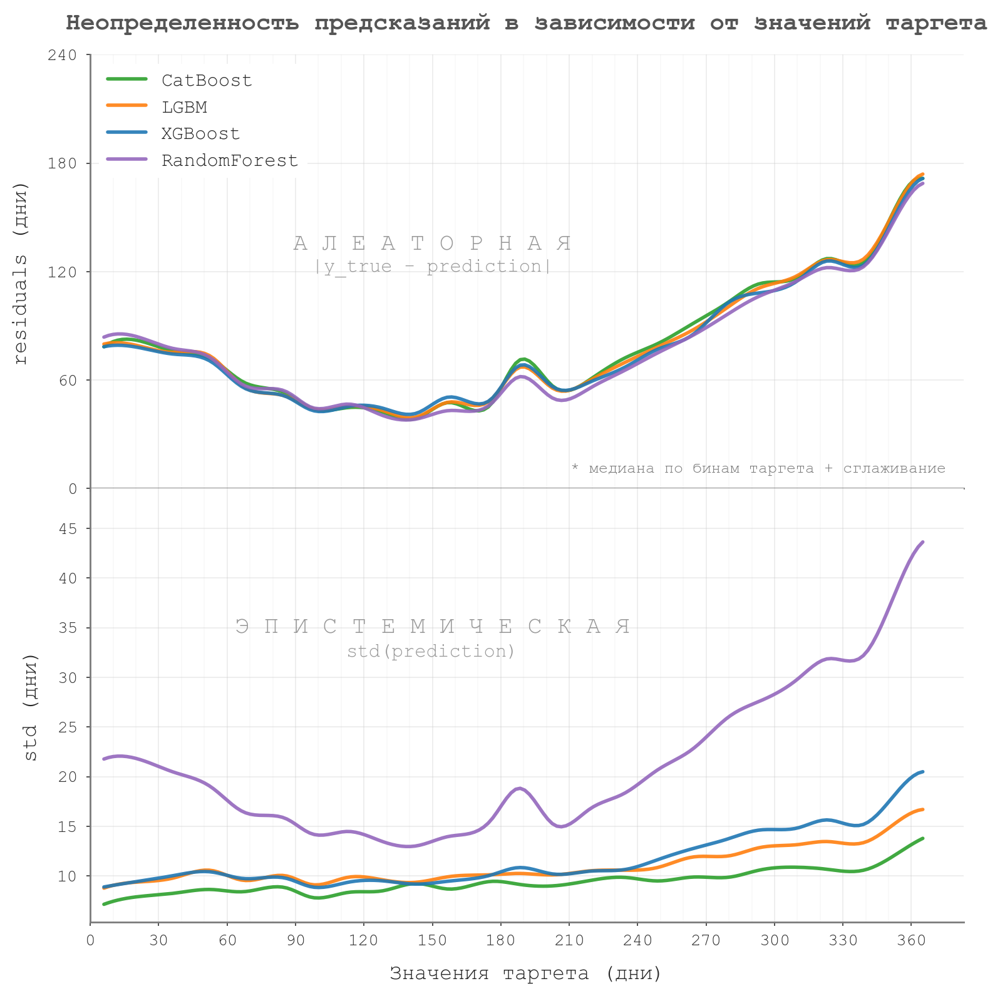

In [116]:
fig, axes = plt.subplots(2, 1, figsize=(9, 9), sharex=True,
                         gridspec_kw={'height_ratios': [1, 1], 'hspace': 0})

models = {
    # 'LinearRegression': (eu_lr, ae_lr, colors[3]),
    'CatBoost': (eu_cb, ae_cb, colors[2]),
    'LGBM': (eu_lgbm, ae_lgbm, colors[1]),
    'XGBoost': (eu_xgb, ae_xgb, colors[0]),
    'RandomForest': (eu_rf, ae_rf, colors[4]),
}

# --- алеаторная --------------------------------
plot_models(axes[0], 'aleatoric')

axes[0].set_title("Неопределенность предсказаний в зависимости от значений таргета")
axes[0].set_ylabel("residuals (дни)")

# ось X
axes[0].set_xlim(left=0)
axes[0].set_xticks(np.arange(0, 366, 30))
axes[0].set_xticks(np.arange(0, 366, 10), minor=True)
axes[0].set_yticks(np.arange(0, 260, 60))

axes[0].grid(which='major', axis='x', alpha=0.3)
axes[0].grid(which='minor', axis='x', alpha=0.1)

# название
t_align = 150
t_color="#999999"

axes[0].text(t_align, 135, 'А Л Е А Т О Р Н А Я',
color=t_color, fontsize=14, va='center', ha='center',)
axes[0].text(t_align, 122, '|y_true - prediction|',
color=t_color, fontsize=11, va='center', ha='center',)

# легенда
axes[0].legend(loc='upper left', frameon=True, 
               facecolor='white', edgecolor='white', framealpha=1)

# комментарий
axes[0].text(0.98, 0.03,
    "* медиана по бинам таргета + сглаживание",
    transform=axes[0].transAxes, ha='right', va='bottom',
    fontsize=9, color="#777777")

# --- эпистемическая -----------------------
plot_models(axes[1], 'epistemic')

axes[1].set_xlabel("Значения таргета (дни)")
axes[1].set_ylabel("std (дни)")
axes[1].grid(alpha=0.3)

# название
axes[1].text(t_align, 35, 'Э П И С Т Е М И Ч Е С К А Я',
color=t_color, fontsize=14, va='center', ha='center',)
axes[1].text(t_align, 32.5, 'std(prediction)',
color=t_color, fontsize=11, va='center', ha='center',)

# ось X
# axes[1].set_yticks(np.arange(0, 366, 60))
axes[1].set_xticks(np.arange(0, 366, 30))
axes[1].set_xticks(np.arange(0, 366, 10), minor=True)
axes[1].grid(which='major', axis='x', alpha=0.3)
axes[1].grid(which='minor', axis='x', alpha=0.1)
axes[1].set_xlim(left=0)
axes[1].set_ylim(top=49)

# plt.tight_layout()
plt.show()

- **Алеаторная неопределенность** (ошибка предсказаний) – у всех бустинговых моделей форма одинаковая: локальный пик на малых значениях, минимум на таргете около 130, сильный рост после таргета ~200. На больших значениях ошибка достигает максимума. Линейная регрессия сильно выбивается – ошибка растет быстрее всех, особенно после ~160. Линейная регрессия не ловит нелинейные зависимости.

- **Эпистемическая неопределенность** (неуверенность модели): у бустингов плавный рост неуверенности с таргетом; у Random Forest - самая высокая неуверенность на всех значениях; у линейной регрессии почти плоская линия. 

Модели недооценивают неопределенность при таргет >200: ошибка растет резко, неуверенность модели гораздо медленнее.\
Линейная регрессия – самая неподходящая модель для этихх данных: ошибка самая высокая, неуверенность почти нулевая.\
CatBoost / LGBM / XGBoost ведут себя очень похоже.
Random Forest – самая осторожная модель при том же уровне ошибок.

---

### Сумма неопределенностей (эпистемическая + алеаторная)

Общая неопределенность: насколько мы не уверены в предсказании в целом. Она состоит из двух частей:
- эпистемической (std предсказаний моделей) – насколько модель сомневается
- алеаторной (resudials = |y_true - prediction|) – насколько модель ошибается.

$\text{total\_incertainty} = \text{epistemic} + \text{aleatoric}$

In [121]:
# общая неопределенность по моделям
# total_lr = eu_lr + ae_lr
total_cb = eu_cb + ae_cb
total_lgbm = eu_lgbm + ae_lgbm
total_xgb = eu_xgb + ae_xgb
total_rf = eu_rf + ae_rf

total_meta = epistemic_uncertainty + ae_meta

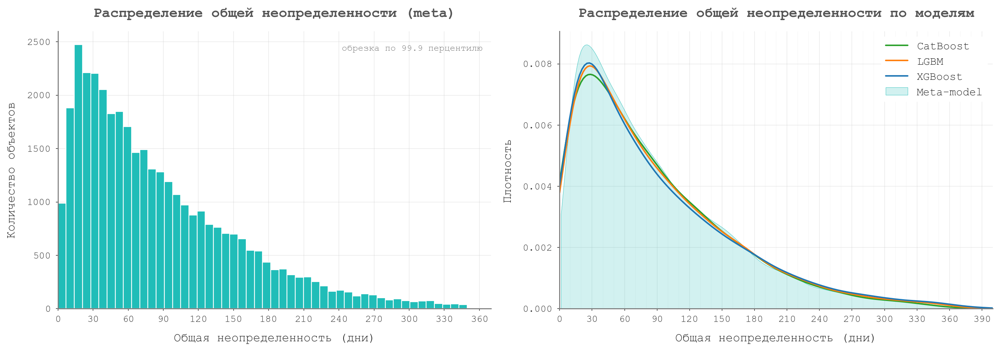

In [122]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# histplot
axes[0].hist(total_meta, bins=50, edgecolor='white', 
             range=(0, np.quantile(total_meta, 0.999)))

axes[0].set_xlabel("Общая неопределенность (дни)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_xlim(0, 370)
axes[0].set_title("Распределение общей неопределенности (meta)")

axes[0].set_xticks(np.arange(0, 371, 30))
axes[0].grid(which='major', axis='x', alpha=0.3)

axes[0].text(0.98, 0.95,
    "обрезка по 99.9 перцентилю",
    transform=axes[0].transAxes,
    ha='right', va='top',
    fontsize=9,
    color="#777777"
)

# total uncertainty по моделям
models_total = {
    # 'LinearRegression': (total_lr, colors[3]),
    'CatBoost': (total_cb, colors[2]),
    'LGBM': (total_lgbm, colors[1]),
    'XGBoost': (total_xgb, colors[0]),
    # 'RandomForest': (total_rf, colors[4]),
}

for name, (data, color) in models_total.items():
    sns.kdeplot(data, bw_adjust=1.5, cut=0, color=color, ax=axes[1], label=name)

# meta-model
sns.kdeplot(total_meta, color=box, cut=0, fill=True,
    alpha=0.2, linewidth=0.3, ax=axes[1], label='Meta-model')

# оформление
axes[1].set_title("Распределение общей неопределенности по моделям")
axes[1].set_xlabel("Общая неопределенность (дни)")
axes[1].set_ylabel("Плотность")
axes[1].set_xlim(0, 400)

axes[1].legend(loc='upper right', frameon=True, 
               facecolor='white', edgecolor='white', framealpha=1)

# тики
axes[1].set_xticks(np.arange(0, 400, 30))
axes[1].set_xticks(np.arange(0, 400, 10), minor=True)

axes[1].grid(which='major', axis='x', alpha=0.3)
axes[1].grid(which='minor', axis='x', alpha=0.1)

plt.tight_layout()
plt.show()

1. **histplot**: основная часть значений общей неопределенности сосредоточена в диапазоне ~0–150, при этом есть длинный правый хвост до 500+. Большинство объектов имеют среднюю суммарную неопределенность, но встречаются редкие случаи с очень высокой.

2. **kde**: все ансамблевые модели (CatBoost, LGBM, XGBoost) ведут себя очень похоже, их распределения почти накладываются – модели совершают ошибки на одних и тех же объектах.\ Random Forest имеет более широкий хвост – эта модель боле чувствительна к сложным объектам.\
Linear Regeression дает более высокую суммарную неопределенность, хуже справляется с предсказаниями.\
Мета-модель: более консервативное распределение неопределенности. Близкое к бустинговым моделям с небольшим смещением вправо за счет влияния линейной регрессии.

Примечание по заданию:\
Связь общей неопределенности с фактической ошибкой строить бессмысленно, потому что фактическая ошибка (residuals) является частью общей неопределенности и будет предсказуемый диагональный тренд.

---

### Метрики, алеаторной, эпистемической и общей неопределенности

In [123]:
models_uncertainty = {
    # 'LinearRegression': (eu_lr, ae_lr),
    'CatBoost': (eu_cb, ae_cb),
    'LGBM': (eu_lgbm, ae_lgbm),
    'XGBoost': (eu_xgb, ae_xgb),
    # 'RandomForest': (eu_rf, ae_rf),
}

In [124]:
summary = []

for name, (eu, ae) in models_uncertainty.items():
    total = eu + ae
    
    summary.append({
        'model': name,
        
        # aleatoric
        'ae_median': np.median(ae),
        'ae_p90': np.quantile(ae, 0.9),
        
        # epistemic
        'eu_median': np.median(eu),
        'eu_p90': np.quantile(eu, 0.9),
        
        # total
        'total_median': np.median(total),
        'total_p90': np.quantile(total, 0.9),
    })

# meta 
summary.append({
    'model': 'Meta-model',
    'ae_median': np.median(ae_meta),
    'ae_p90': np.quantile(ae_meta, 0.9),
    'eu_median': np.median(epistemic_uncertainty),
    'eu_p90': np.quantile(epistemic_uncertainty, 0.9),
    'total_median': np.median(total_meta),
    'total_p90': np.quantile(total_meta, 0.9),
})

df_summary = pd.DataFrame(summary).set_index('model').round(2)

display(df_summary.reset_index())

,model,ae_median,ae_p90,eu_median,eu_p90,total_median,total_p90
0,CatBoost,58.35,168.84,7.71,17.35,66.98,183.58
1,LGBM,58.06,169.09,8.95,20.06,67.22,188.00
2,XGBoost,56.77,169.91,9.00,23.90,66.04,192.86
3,Meta-model,54.40,167.83,11.00,23.60,68.44,183.97


**Медианные оценки неопределенности по моделям**

1. **Алеаторная неопределенность**:\
Мета-модель улучшает предсказания отдельных моделей, ее ошибки минимальны по отношению к ошибкам моделей в стекинге.\
Бустинговые модели дают близкие оценки и ошибаются в среднем на 57 дней (CatBoost ~58, LGBM ~58, XGB ~56)

2. **Эпистемическая неопределенность**:\
Самая уверенная в своих предсказаниях – линейная регрессия. Из-за несогласия базовых моделей между собой эпистемическая неопределенность мета-модели самая высокая.\
Среди бустинговых моделей наиболее уверена в предсказаниях CatBoost (7.64), затем LGBM (8.97) и XGBoost (9.11). RandomForest сомневается больше (16.70).

Базовые бустинговые модели очень похожи, их медианную ошибку можно интерпретировать примерно на уровне 57 $\pm$ 8 дней.

3. **Суммарная медианная неопределенность** мета-модели выше базовых бустинговых (~80), но ниже линейной регрессии.\
При оценке 90% вероятности мета-модель выравнивается и дает неуверенность близкую к отдельным бустинговым моделям.  
Можно предположить, что если убрать линейную регрессию из ансамбля, показатели мета-модели улучшатся.

\
**Ансамблевые бустинговые модели** (CatBoost, LGBM, XGBoost) имеют наилучший баланс между ошибкой и неопределенностью, они обладают низкой алеаторной ошибкой и средней эпистемической неопределенностью.

**Linear Regression** дает уверенные, но некорректные предсказания.

**Random Forest** имеет высокую эпистемическую неопределенность, его предсказания нестабильны.

**Мета-модель** имеет более низкую алеаторную ошибку по сравнению с отдельными моделями, существенно большей эпистемической неопределенностью. В результате суммарная неопределенность мета-модели оказывается выше, чем у лучших базовых моделей.

---

### **Вывод**
- Основное ограничение качества моделей связано не столько с их архитектурой, сколько со структурой данных: дисбалансом таргета, большим количеством нулевых значений. В таких условиях модели склонны смещать предсказания к среднему, растут ошибки на сложных наблюдениях.
- В качестве варианта решения можно рассмотреть подход в два этапа: сначала классифицировать объекты с нулевым таргетом, затем отдельно моделировать предсказания для остальных объектов.
- Также можно протестировать увеличение количества признаков, например извлеченных из текста описания листингов – влияет ли длина описания, структура текста, наличие определенных ключевых слов на таргет.
- Объекты с высокой суммарной непределенностью стоит проанализировать отдельно.